In [1]:
import cv2
import os
import skimage
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pickle
import math
import tqdm
from skimage.feature import local_binary_pattern
from timeit import default_timer as timer
import pytesseract

In [2]:
def get_dict_from_data(path, extension=".jpg"):
    dictionary = dict()
    for file in sorted(os.listdir(path)):
        if file.endswith(extension):
            key = os.path.splitext(file)[0].split('_').pop()
            if extension == ".txt":
                f = open(os.path.join(path, file), "r",encoding = "ISO-8859-1").read()
                line = f.strip().strip('()')
                parts = line.split(', ')
                author = parts[0].strip("''")
                dictionary[key] = author
            else:
                dictionary[key] = cv2.imread(os.path.join(path, file))
    return dictionary

In [3]:
BBDD_PATH = './BBDD/'
QSD1_W4_PATH = './qsd1_w4/'

bbdd = get_dict_from_data(BBDD_PATH)
qsd1_w4 = get_dict_from_data(QSD1_W4_PATH)

In [4]:
with open('./qsd1_w4/gt_corresps.pkl', 'rb') as f:
    cor1_w4 = pickle.load(f)

In [5]:
with open('./qsd1_w4/frames.pkl', 'rb') as f:
    frames1_w4 = pickle.load(f)

In [6]:
with open('./qsd1_w4/text_boxes.pkl', 'rb') as f:
    text_boxes1_w4 = pickle.load(f)

## GET MEDIANS

In [7]:
def get_medians(qs):
    
    result = dict()
    
    for name, img in qs.items():
        median_img = cv2.medianBlur(img, 3)
        result[name] = median_img
        
    return result

### GET TEXT BOXES MASKS

In [8]:
def get_name_boxs(img):
    
    h_i, w_i, c = img.shape
    
    top_limit = int(round(h_i/6))
    bottom_limit = int(h_i - top_limit)
    
    left_area = int(round(w_i/3))
    right_area = int(left_area*2)
    
    area_pixel= int(h_i*w_i)
    
    # BGR to Lab conversion, and take L channel only
    image = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)
    imageL = image[:, :, 0]
    
    # Black hat and top hat separately to the L channel image
    kernel = np.ones((2, 10),np.uint8)
    thL = cv2.morphologyEx(imageL, cv2.MORPH_TOPHAT, kernel, iterations = 5)
    bhL = cv2.morphologyEx(imageL, cv2.MORPH_BLACKHAT, kernel, iterations = 5)
    
    # Take the highest value pixels, mostly letters
    fthL_th = thL.max() - 50
    fthL = (thL[:, :] > fthL_th) * 255
    fthL = fthL.astype('uint8')    
        
    fbhL_th = bhL.max() - 50
    fbhL = (bhL[:, :] > fbhL_th) * 255
    fbhL = fbhL.astype('uint8')
    
    # OR between top hat and black hat most important pixels
    mix = fbhL + fthL
    mix = mix>1
    mix= mix.astype('uint8')
    
    # Closing
    kernel = np.ones((20, 30),np.uint8)
    closing = cv2.morphologyEx(mix, cv2.MORPH_CLOSE, kernel)
    
    
    # Connected Components
    analysis = cv2.connectedComponentsWithStats(closing,4, cv2.CV_32S) 
    (totalLabels, label_ids, values, centroid) = analysis 

    # Initialize a new image to store  
    # all the output components 
    output = np.zeros(imageL.shape, dtype="uint8") 

    # Loop through each component 
    mask = np.zeros([h_i,w_i], dtype=np.uint8)
    cont=0
    x1_prev= -10000
    for i in range(1, totalLabels): 
        
        # Area of the component 
        area = values[i, cv2.CC_STAT_AREA]  
        
        (X, Y) = centroid[i]
        
        if (area >round(area_pixel*0.0009)) and ((Y<top_limit)or(Y>bottom_limit))and ((X>left_area)and(X<right_area)): 
            x1 = values[i, cv2.CC_STAT_LEFT] 
            y1 = values[i, cv2.CC_STAT_TOP] 
            w = values[i, cv2.CC_STAT_WIDTH] 
            h = values[i, cv2.CC_STAT_HEIGHT]
            
            pt1 = (x1, y1) 
            pt2 = (x1+ w, y1+ h)
            if (int(x1 - x1_prev) < int(round(w_i/4)) and (int(x1 - x1_prev) > int(round(-w_i/4)))):
                roi_corners = np.array([(x1_prev,y1_prev),(x1+w,y1), pt2,(x1_prev,y1+h)], dtype=np.int32)
            else:
                roi_corners = np.array([pt1,(x1+w,y1), pt2,(x1,y1+h)], dtype=np.int32)
                
            cv2.fillPoly(mask, [roi_corners], 255)
            output = cv2.bitwise_or(output, mask)
            cont = cont+1
            x1_prev= x1
            y1_prev = y1                           
                        
    if cont == 0:
        output = fthL
        
        
    # Closing
    kernel2 = np.ones((int(h_i*0.001), int(w_i*0.03)),np.uint8)
    closing2 = cv2.morphologyEx(output, cv2.MORPH_CLOSE, kernel2)
    
    # Dilation
    kernel3 = np.ones((int(h_i*0.03), int(w_i*0.003)),np.uint8)
    dilate = cv2.dilate(closing2,kernel3)

    #print(thL.max())
    #print(np.count_nonzero((fthL < 350)&(fthL > 0)))
    
    # For visualization:
    """
    plt.axis("off")
    fig, ax = plt.subplots(nrows=3, ncols=3, figsize = (10, 10))
    
    ax[0, 0].imshow(dilate, cmap = "gray")
    ax[0, 1].imshow(closing, cmap = "gray")
    ax[0, 2].imshow(closing2, cmap = "gray")
    
    ax[1, 0].imshow(thL, cmap = "gray")
    ax[1, 1].imshow(fthL, cmap = "gray")        
    ax[1, 2].imshow(mix, cmap = "gray")
    
    ax[2, 0].imshow(bhL, cmap = "gray")
    ax[2, 1].imshow(fbhL, cmap = "gray")
    ax[2, 2].imshow(output, cmap = "gray")
    """
    
    return dilate

In [9]:
def get_tl_and_br(mask):
    
    xl = 100000
    xr = -1
    yu = 100000
    yd = -1
    
    for y in range(mask.shape[0]):
        for x in range(mask.shape[1]):
            if mask[y, x] == 255:
                if x < xl: xl = x
                if x > xr: xr = x
                if y < yu: yu = y
                if y > yd: yd = y
    
    return (xl, yu), (xr, yd)

In [10]:
def get_pred_cords(masks_dict):

    result = []
    for name, mask in masks_dict.items():
        tl, br = get_tl_and_br(mask)
        result.append([tl[0], tl[1], br[0], br[1]])
        
    return result

In [11]:
def get_pred_masks(qs):
    
    masks_dict = dict()
    
    for name, img in qs.items():
        masks_dict[name] = get_name_boxs(img)
    
    return masks_dict

In [12]:
def get_rectangular_predicted_masks(qs):
    masks_dict = dict()
    
    
    for name, img in tqdm.tqdm(qs.items()):
        not_rect_mask = get_name_boxs(img)
        
        tl, br = get_tl_and_br(not_rect_mask)
        tr = (br[0], tl[1])
        bl = (tl[0], br[1])
        
        #print(f"tl: {tl}, tr:{tr}, bl: {bl}, br: {br}")
        
        rect_mask = np.zeros((img.shape[0], img.shape[1]), dtype = np.uint8)
        roi_corners = np.array([tl, tr, br, bl], dtype = np.int32)
        cv2.fillPoly(rect_mask, [roi_corners], 255)
        
        masks_dict[name] = rect_mask
        
    return masks_dict

### DIVIDE PAINTINGS

In [13]:
# LAST WEEK'S, BUT WE NOW MAY HAVE 3 PAINTINGS IN ONE PICTURE, SO WE HAVE CHANGED THE FUNCTION
# THE ONE THAT WE ARE GOING TO USE IS THE ONE BELOWE THIS BLOCK

def order_tls_and_brs_w2(tls_and_brs, centroids): 
    if len(tls_and_brs) < 2: return tls_and_brs

    
    if len(tls_and_brs) == 2:
        if ((centroids[0][0] - centroids[1][0])**2 < (centroids[0][1] - centroids[1][1])**2): horizontal_ordering = False
        else: horizontal_ordering = True

        if horizontal_ordering:
            if centroids[0][0] < centroids[1][0]: return tls_and_brs
            else: return [tls_and_brs[1], tls_and_brs[0]] 
        else:
            if centroids[0][1] < centroids[1][1]: return tls_and_brs
            else: return [tls_and_brs[1], tls_and_brs[0]]
            
    else:
        if ((centroids[0][0] - centroids[1][0])**2 < (centroids[0][1] - centroids[1][1])**2): horizontal_ordering = False
        else: horizontal_ordering = True
        
        
        X = np.array(centroids[0][0], centroids[1][0], centroids[2][0])
        Y = np.array(centroids[0][1], centroids[1][1], centroids[2][1])
            
        
        if horizontal_ordering:
            idx_min = np.argmin(X)
            idx_max = np.argmax(X)
            
            if 0 not in [idx_min, idx_max]:
                middle = 0
            elif 1 not in [idx_min, idx_max]:
                middle = 1
            elif 2 not in [idx_min, idx_max]:
                middle = 2
            
            return tls_and_brs[idx_min], 
            
        else:
            if centroids[0][1] < centroids[1][1]: return tls_and_brs
            else: return [tls_and_brs[1], tls_and_brs[0]]    


In [14]:
def order_tls_and_brs(tls_and_brs, centroids): 
    if len(tls_and_brs) < 2: return tls_and_brs
    
    if ((centroids[0][0] - centroids[1][0])**2 < (centroids[0][1] - centroids[1][1])**2): horizontal_ordering = False
    else: horizontal_ordering = True
        
    
    if len(tls_and_brs) == 2:
        dtype = [('order', int), ('X', float), ('Y', float)]
        values = [(0, centroids[0][0], centroids[0][1]), (1, centroids[1][0], centroids[1][1])]
        a = np.array(values, dtype=dtype)    
        if horizontal_ordering: a = np.sort(a, order='X')
        else: a = np.sort(a, order='Y')
            
        return [tls_and_brs[a[0][0]], tls_and_brs[a[1][0]]]
    
        
    if len(tls_and_brs) == 3:
        dtype = [('order', int), ('X', float), ('Y', float)]
        values = [(0, centroids[0][0], centroids[0][1]), (1, centroids[1][0], centroids[1][1]),(2, centroids[2][0], centroids[2][1])]
        a = np.array(values, dtype=dtype)    
        print(a)
        if horizontal_ordering: a = np.sort(a, order = 'X')
        else: a = np.sort(a, order='Y')
            
        return [tls_and_brs[a[0][0]], tls_and_brs[a[1][0]], tls_and_brs[a[2][0]]]

In [15]:
def divide_paintings_w2(img):
    
    h_i, w_i, c = img.shape
    
    top_limit = int(round(h_i/8))
    bottom_limit = int(h_i - top_limit)
    
    left_area = int(round(w_i/8))
    right_area = int(w_i - left_area)
    
    area_pixel= int(h_i*w_i)
    
    image = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)
    imageL = image[:, :, 0]
    imagea = image[:, :, 1]
    imageb = image[:, :, 2]
    
    #kernel = np.ones((2, 10),np.uint8)
    #thL = cv2.morphologyEx(imageL, cv2.MORPH_TOPHAT, kernel, iterations = 5)
    #bhL = cv2.morphologyEx(imageL, cv2.MORPH_BLACKHAT, kernel, iterations = 5)
    
    kernel = np.ones((2, 2),np.uint8)
    gradL = cv2.morphologyEx(imageL, cv2.MORPH_GRADIENT, kernel, iterations = 20)

    ret2, th2 = cv2.threshold(gradL,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    
    kernel = np.ones((round(h_i*0.001), round(w_i*0.001)),np.uint8)
    opening1 = cv2.morphologyEx(th2, cv2.MORPH_OPEN, kernel, iterations = 3)
    
    
    # -----------------------------------------------------------------------
    analysis = cv2.connectedComponentsWithStats(opening1, 4, cv2.CV_32S) 
    (totalLabels, label_ids, values, centroid) = analysis 

    # Initialize a new image to store  
    # all the output components 
    output1 = np.zeros(imageL.shape, dtype="uint8") 

    # Loop through each component 
    
    mask = np.zeros([h_i,w_i], dtype=np.uint8)
    cont=0
    x1_prev= -10000
    for i in range(1, totalLabels): 
        
          # Area of the component 
        area = values[i, cv2.CC_STAT_AREA]  
        
        (X, Y) = centroid[i]
         
        #if True:
        if (area > round(area_pixel*0.00001)):
            x1 = values[i, cv2.CC_STAT_LEFT] 
            y1 = values[i, cv2.CC_STAT_TOP] 
            w = values[i, cv2.CC_STAT_WIDTH] 
            h = values[i, cv2.CC_STAT_HEIGHT]
            
            pt1 = (x1, y1) 
            pt2 = (x1+ w, y1+ h)
            if (int(x1 - x1_prev) < int(round(w_i/4)) and (int(x1 - x1_prev) > int(round(-w_i/4)))):
                roi_corners = np.array([(x1_prev,y1_prev),(x1+w,y1), pt2,(x1_prev,y1+h)], dtype=np.int32)
            else:
                roi_corners = np.array([pt1,(x1+w,y1), pt2,(x1,y1+h)], dtype=np.int32)
        
               
            cv2.fillPoly(mask, [roi_corners], 255)
            output1 = cv2.bitwise_or(output1, mask)
            cont = cont+1
            x1_prev= x1
            y1_prev = y1                           
            
    if cont == 0:
        output1 = th2
        
    #print(cont)
    
    # ---------------------------------------------------------------
    
    kernel = np.ones((round(h_i*0.02), round(w_i*0.01)),np.uint8)
    opening2 = cv2.morphologyEx(output1, cv2.MORPH_OPEN, kernel, iterations = 15)
    
    # -----------------------------------------------------------------------
    analysis2 = cv2.connectedComponentsWithStats(opening2, 4, cv2.CV_32S) 
    (totalLabels2, label_ids2, values2, centroid2) = analysis2 

    # Initialize a new image to store  
    # all the output components 
    output2 = np.zeros(imageL.shape, dtype="uint8") 

    # Loop through each component 
    
    mask2 = np.zeros([h_i,w_i], dtype=np.uint8)
    cont=0
    
    tls_and_brs = []
    centroids = []
    
    for i in range(1, totalLabels2): 

        x1_prev= -10000
        
          # Area of the component 
        area = values2[i, cv2.CC_STAT_AREA]  
        
        (X, Y) = centroid2[i]
        
        if area > round(area_pixel*0.05):
        #if (area > round(area_pixel*0.2)) and ((Y<top_limit)or(Y>bottom_limit))and ((X>left_area)and(X<right_area)): 
            x1 = values2[i, cv2.CC_STAT_LEFT] 
            y1 = values2[i, cv2.CC_STAT_TOP] 
            w = values2[i, cv2.CC_STAT_WIDTH] 
            h = values2[i, cv2.CC_STAT_HEIGHT]
            
            pt1 = (x1, y1) 
            pt2 = (x1+ w, y1+ h)
            if (int(x1 - x1_prev) < int(round(w_i/4)) and (int(x1 - x1_prev) > int(round(-w_i/4)))):
                roi_corners2 = np.array([(x1_prev,y1_prev),(x1+w,y1), pt2,(x1_prev,y1+h)], dtype=np.int32)
            else:
                roi_corners2 = np.array([pt1,(x1+w,y1), pt2,(x1,y1+h)], dtype=np.int32)
        
               
            cv2.fillPoly(mask2, [roi_corners2], 255)
            output2 = cv2.bitwise_or(output2, mask2)
            cont = cont+1
            x1_prev= x1
            y1_prev = y1    
            
            tls_and_brs.append([roi_corners2[0][0], roi_corners2[0][1], roi_corners2[2][0], roi_corners2[2][1]])
            centroids.append([X, Y])
            
    if cont == 0:
        output2 = output1
    
    # ---------------------------------------------------------------
    '''
    # for visualization:
    fig, ax = plt.subplots(nrows=2, ncols=3, figsize = (10, 10))
    
    ax[0, 0].imshow(imageL, cmap = "gray")
    ax[0, 1].imshow(th2, cmap = "gray")
    ax[0, 2].imshow(opening1, cmap = "gray")
    
    ax[1, 0].imshow(output1, cmap = "gray")
    ax[1, 1].imshow(opening2, cmap = "gray")
    ax[1, 2].imshow(output2, cmap = "gray")
    '''
    
    tls_and_brs = order_tls_and_brs(tls_and_brs, centroids)
    
    return tls_and_brs, output2

## TASK 1

### Keypoints

#### Harris corner detector

In [16]:
# https://docs.opencv.org/4.x/dc/d0d/tutorial_py_features_harris.html

In [17]:
def Harris_corner_one_img(img):

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # CONVERT IMG TO FLOAT 32, INSTEAD OF INTEGERS
    gray_img = np.float32(gray_img)
    
    # It is the size of neighbourhood considered for corner detection
    BLOCK_SIZE = 5
    
    # Aperture parameter of the Sobel derivative used.
    K_SIZE = 9
    
    # Harris detector free parameter in the equation.
    K = 0.04
      
    dst = cv2.cornerHarris(gray_img, BLOCK_SIZE, K_SIZE, K)
    print(img.shape)
    print(len(dst))
    
    # SE PUEDE DILATAR LA IMAGEN PARA MARCAR MEJOR LOS BORDES, PERO ES OPCIONAL
    #result is dilated for marking the corners, not important
    dst = cv2.dilate(dst,None)
    
    result = img.copy()
    dst = cv2.cornerHarris(gray_img, BLOCK_SIZE, K_SIZE, K)
    result[dst>0.01*dst.max()]=[255,0,0]
    
    plt.imshow(result)
    plt.axis("off")

(764, 1228, 3)
764


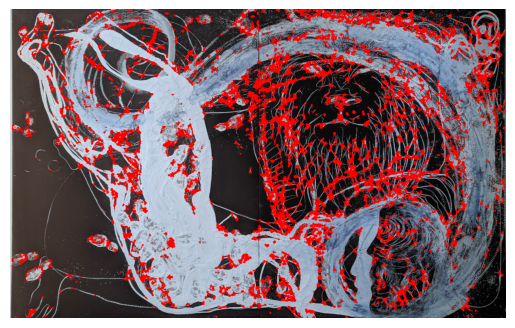

In [18]:
Harris_corner_one_img(bbdd["00010"])

In [19]:
def compute_harris_descriptors(bbdd, block_size, k_size, k):
    
    desc_dict = dict()
    
    for name, img in tqdm.tqdm(bbdd.items()):
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
        # CONVERT IMG TO FLOAT 32, INSTEAD OF INTEGERS
        gray_img = np.float32(gray_img)

        # It is the size of neighbourhood considered for corner detection
        BLOCK_SIZE = block_size

        # Aperture parameter of the Sobel derivative used.
        K_SIZE = k_size

        # Harris detector free parameter in the equation.
        K = k

        dst = cv2.cornerHarris(gray_img, BLOCK_SIZE, K_SIZE, K)

        # SE PUEDE DILATAR LA IMAGEN PARA MARCAR MEJOR LOS BORDES, PERO ES OPCIONAL
        #result is dilated for marking the corners, not important
        dst = cv2.dilate(dst,None)

        result = img.copy()
        # Threshold for an optimal value, it may vary depending on the image.
        result[dst>0.01*dst.max()]=[0,0,255]
        
        desc_dict[name] = result
        
    return desc_dict
            
        
    

#### SIFT

In [20]:
#https://docs.opencv.org/4.x/da/df5/tutorial_py_sift_intro.html

In [21]:
def imshow_SIFT(img, mask = None):
    
    new_img = img.copy()
    gray_img = cv2.cvtColor(new_img, cv2.COLOR_BGR2GRAY)
       
    sift = cv2.SIFT_create()
    kp, des = sift.detectAndCompute(gray_img, mask)
    
    result = cv2.drawKeypoints(new_img, kp, None, (255,0,0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    
    plt.figure(figsize = (11, 11))
    plt.axis("off")
    plt.imshow(result)
    
    

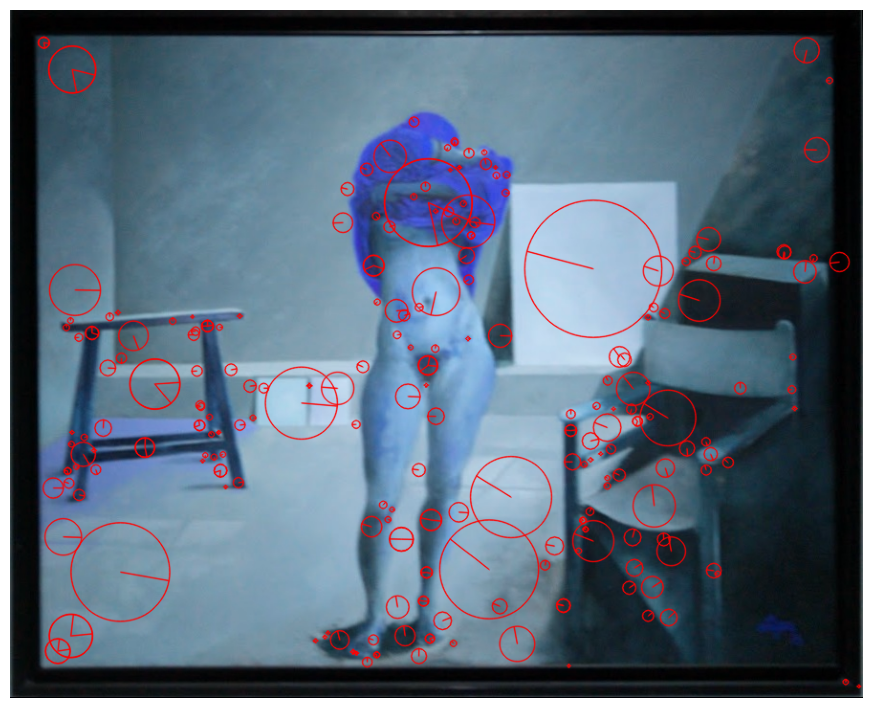

In [22]:
imshow_SIFT(bbdd["00211"])

In [23]:
def SIFT_img(img, mask):
    
    if img.ndim == 3: gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else: gray_img = img
       
    sift = cv2.SIFT_create()
    kp, des = sift.detectAndCompute(gray_img, mask)
    
    return kp, des

In [24]:
# FOR BBDD
def compute_sift_descriptors(bbdd):
    
    desc_dict = dict()
    
    for name, img in tqdm.tqdm(bbdd.items()):
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
        # for median bbdd
        #median_gray = cv2.medianBlur(gray_img, 3)
        
        
        
        #grad_x = cv2.Sobel(median_gray, cv2.CV_64F, 1, 0)
        #grad_y = cv2.Sobel(median_gray, cv2.CV_64F, 0, 1)
        #grad = np.sqrt(grad_x**2 + grad_y**2)
        #grad_norm = (grad * 255 / grad.max()).astype(np.uint8)

        #ret2, th2 = cv2.threshold(grad_norm, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
            
    
        sift = cv2.SIFT_create()
        kp, des = sift.detectAndCompute(gray_img, None)
        
        desc_dict[name] = des
        
    return desc_dict

In [25]:
# VAMOS A USAR EL ORB YA QUE ES MUCHO MAS RAPIDO QUE EL SIFT
#bbdd_sift = compute_sift_descriptors(bbdd)

In [26]:
#https://docs.opencv.org/4.x/df/dd2/tutorial_py_surf_intro.html

In [27]:
def SURF_one_img(name):
    
    img = qsd1_w4[name]
    new_img = img.copy()
    gray_img = cv2.cvtColor(new_img, cv2.COLOR_BGR2GRAY)
       
    SURF = cv2.xfeatures2d.SURF_create(400)
    kp, des = surf.detectAndCompute(gray_img, None)   
    result = cv2.drawKeypoints(new_img, kp, None, (255,0,0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize = (10, 10))
    ax[0].imshow(img)
    ax[1].imshow(gray_img, cmap="gray")
    ax[2].imshow(result)

In [28]:
#SURF_one_img("00000")

### ORB

In [29]:
def imshow_ORB(name):
    
    img = bbdd[name]
    new_img = img.copy()
    gray_img = cv2.cvtColor(new_img, cv2.COLOR_BGR2GRAY)
       
    # Initiate SIFT detector
    orb = cv2.ORB_create()
    
    # find the keypoints with ORB
    kp = orb.detect(gray_img, None)
    
    # compute the descriptors with ORB
    kp, des = orb.compute(gray_img, kp)
    
    result = cv2.drawKeypoints(new_img, kp, None, (255,0,0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    
    plt.figure(figsize = (11, 11))
    plt.axis("off")
    plt.imshow(result)
    

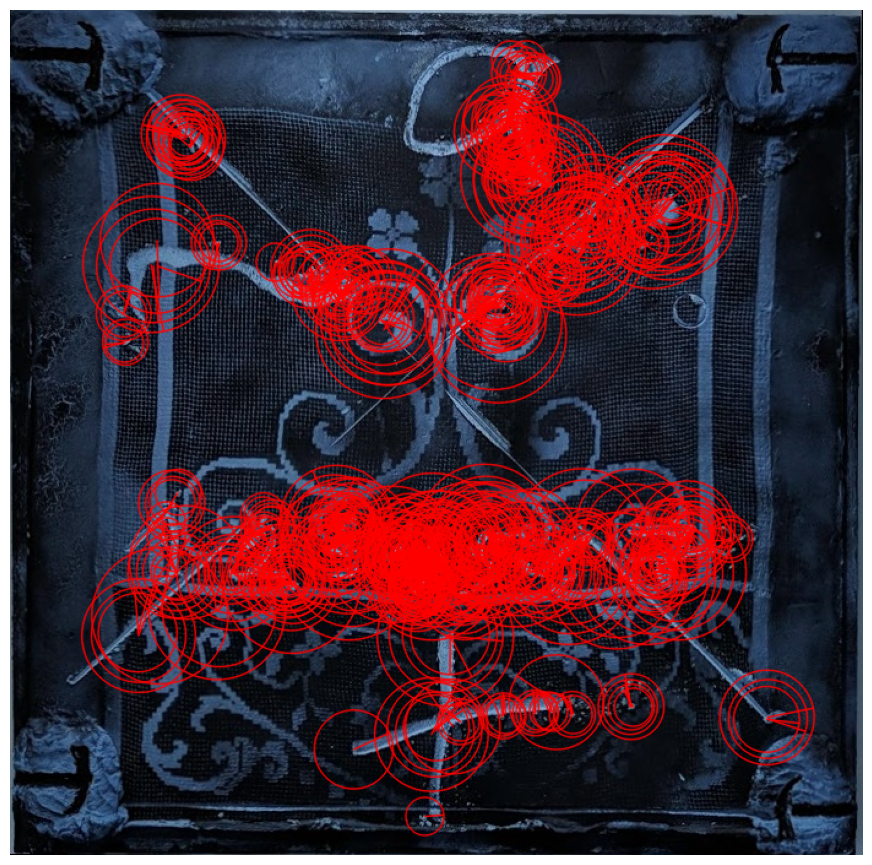

In [30]:
imshow_ORB("00110")

In [31]:
def ORB_img(img, mask):
    
    if img.ndim == 3: gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else: gray_img = img
        
    orb = cv2.ORB_create()
    kp, des = orb.detectAndCompute(gray_img, mask)
        
    return kp, des

In [32]:
# for BBDD
def compute_orb_descriptors(bbdd):
    
    desc_dict = dict()
    
    for name, img in tqdm.tqdm(bbdd.items()):
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
       
        rect_mask_bbdd = np.full((gray_img.shape[0], gray_img.shape[1]), 255, dtype = np.uint8)

        border_size_height = int(0.2 * gray_img.shape[0])
        border_size_width = int(0.2 * gray_img.shape[1])
        
        rect_mask_bbdd[:border_size_height, :] = 0  # Top border
        rect_mask_bbdd[-border_size_height:, :] = 0  # Bottom border
        rect_mask_bbdd[:, :border_size_width] = 0  # Left border
        rect_mask_bbdd[:, -border_size_width:] = 0  # Right border
            
        orb = cv2.ORB_create()
        kp, des = orb.detectAndCompute(gray_img, rect_mask_bbdd)
         
        desc_dict[name] = (kp, des)
        
    return desc_dict

In [33]:
bbdd_orb = compute_orb_descriptors(bbdd)

100%|█████████████████████████████████████████████████████████████████████████████████| 287/287 [00:16<00:00, 17.62it/s]


In [34]:
bbdd_orb_median_masked = compute_orb_descriptors(get_medians(bbdd))

100%|█████████████████████████████████████████████████████████████████████████████████| 287/287 [00:19<00:00, 14.60it/s]


### FAST

In [35]:
# https://docs.opencv.org/4.x/df/d0c/tutorial_py_fast.html

In [36]:
def FAST_one_img(name):
    
    img = bbdd[name]
    new_img = img.copy()
    gray_img = cv2.cvtColor(new_img, cv2.COLOR_BGR2GRAY)
       
    fast = cv2.FastFeatureDetector_create()
    kp = fast.detect(gray_img, None)
    
    result = cv2.drawKeypoints(new_img, kp, None, (255,0,0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    
    plt.figure(figsize = (11, 11))
    plt.axis("off")
    plt.imshow(result)

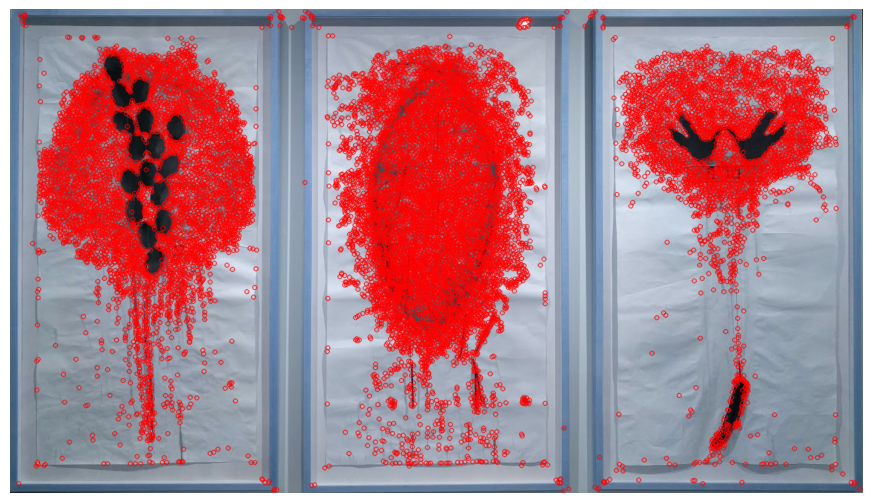

In [37]:
FAST_one_img("00005")

### AKAZE

In [38]:
def AKAZE_img(img, mask):
    
    if img.ndim == 3: gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else: gray_img = img
        
    akaze = cv2.AKAZE_create()
    kp, des = akaze.detectAndCompute(gray_img, mask)
        
    return kp, des

number of keypoints:  144


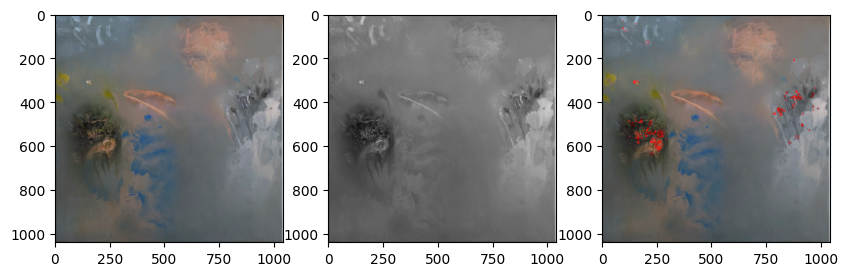

In [39]:
name = "00006"

img = bbdd[name]
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

kp, des = AKAZE_img(gray_img, None)
print("number of keypoints: ", len(kp))

result = cv2.drawKeypoints(img, kp, None, (255,0,0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

fig, ax = plt.subplots(nrows=1, ncols=3, figsize = (10, 10))
ax[0].imshow(img)
ax[1].imshow(gray_img, cmap="gray")
ax[2].imshow(result)

In [40]:
def imshow_AKAZE(name):
    
    img = bbdd[name]
    new_img = img.copy()
    gray_img = cv2.cvtColor(new_img, cv2.COLOR_BGR2GRAY)
       
    akaze = cv2.AKAZE_create()
    kp, des = akaze.detectAndCompute(gray_img, None)
    
    result = cv2.drawKeypoints(new_img, kp, None, (255,0,0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    
    plt.figure(figsize = (11, 11))
    plt.axis("off")
    plt.imshow(result)
    

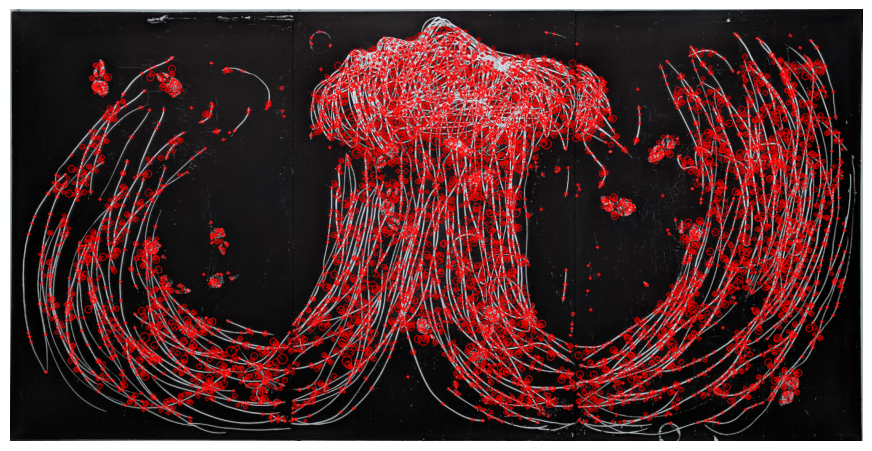

In [41]:
imshow_AKAZE("00121")

In [42]:
# for BBDD
def compute_akaze_descriptors(bbdd):
    
    desc_dict = dict()
    
    for name, img in tqdm.tqdm(bbdd.items()):
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
       
        rect_mask_bbdd = np.full((gray_img.shape[0], gray_img.shape[1]), 255, dtype = np.uint8)

        border_size_height = int(0.2 * gray_img.shape[0])
        border_size_width = int(0.2 * gray_img.shape[1])
        
        rect_mask_bbdd[:border_size_height, :] = 0  # Top border
        rect_mask_bbdd[-border_size_height:, :] = 0  # Bottom border
        rect_mask_bbdd[:, :border_size_width] = 0  # Left border
        rect_mask_bbdd[:, -border_size_width:] = 0  # Right border
            
        akaze = cv2.AKAZE_create()
        kp, des = akaze.detectAndCompute(gray_img, rect_mask_bbdd)
         
        desc_dict[name] = (kp, des)
        
    return desc_dict

In [43]:
bbdd_akaze_median_masked = compute_akaze_descriptors(get_medians(bbdd))

100%|█████████████████████████████████████████████████████████████████████████████████| 287/287 [03:08<00:00,  1.52it/s]


In [44]:

def compute_set_descriptors(bbdd, method):
    desc_dict = dict()
    for name, img in tqdm.tqdm(bbdd.items()):
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
       
        rect_mask_bbdd = np.full((gray_img.shape[0], gray_img.shape[1]), 255, dtype = np.uint8)
        border_size_height = int(0.2 * gray_img.shape[0])
        border_size_width = int(0.2 * gray_img.shape[1])
        rect_mask_bbdd[:border_size_height, :] = 0  # Top border
        rect_mask_bbdd[-border_size_height:, :] = 0  # Bottom border
        rect_mask_bbdd[:, :border_size_width] = 0  # Left border
        rect_mask_bbdd[:, -border_size_width:] = 0  # Right border
        
        if method == "ORB":
            orb = cv2.ORB_create()
            kp, des = orb.detectAndCompute(gray_img, rect_mask_bbdd)
        elif method == "SIFT":
            sift = cv2.SIFT_create()
            kp, des = sift.detectAndCompute(gray_img, None)
        elif method == "AKAZE":
            akaze = cv2.AKAZE_create()
            kp, des = akaze.detectAndCompute(gray_img, rect_mask_bbdd)

        desc_dict[name] = (kp, des)
        
    return desc_dict

### Shi-Tomasi Corner Detector & Good Features to Track

In [45]:
def ShiTomasi_one_img(name):
    
    img = bbdd[name]
    new_img = img.copy()
    gray_img = cv2.cvtColor(new_img, cv2.COLOR_BGR2GRAY)
       
    corners = cv2.goodFeaturesToTrack(gray_img, 300, 0.01, 10)
    corners = np.int0(corners)

    result = img.copy()
    for i in corners:
        x, y = i.ravel()
        cv2.circle(result, (x, y), 20, 255, -1)
    
    plt.figure(figsize = (11, 11))
    plt.axis("off")
    plt.imshow(result)

/var/folders/3n/fbskqxkj1b33wzmg5qy6wdbr0000gn/T/ipykernel_26049/1722385707.py:8: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  corners = np.int0(corners)


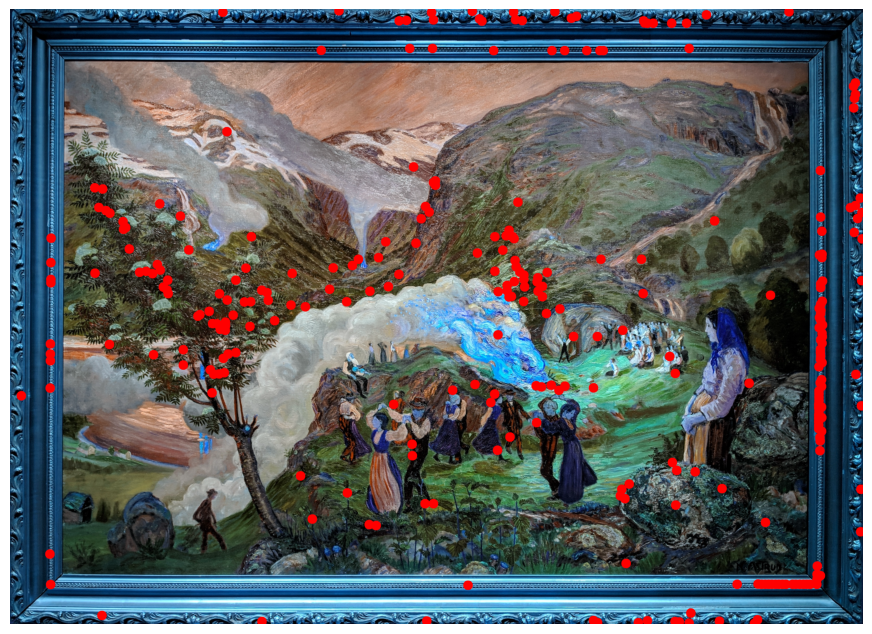

In [46]:
ShiTomasi_one_img("00140")

In [47]:
def MSER_one_img(name):
       
    img = bbdd[name]
    new_img = img.copy()
    gray_img = cv2.cvtColor(new_img, cv2.COLOR_BGR2GRAY)
       
    mser = cv2.MSER_create()
    kp = mser.detect(gray_img, None)
    
    result = cv2.drawKeypoints(new_img, kp, None, (255,0,0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    
    plt.figure(figsize = (11, 11))
    plt.axis("off")
    plt.imshow(result)

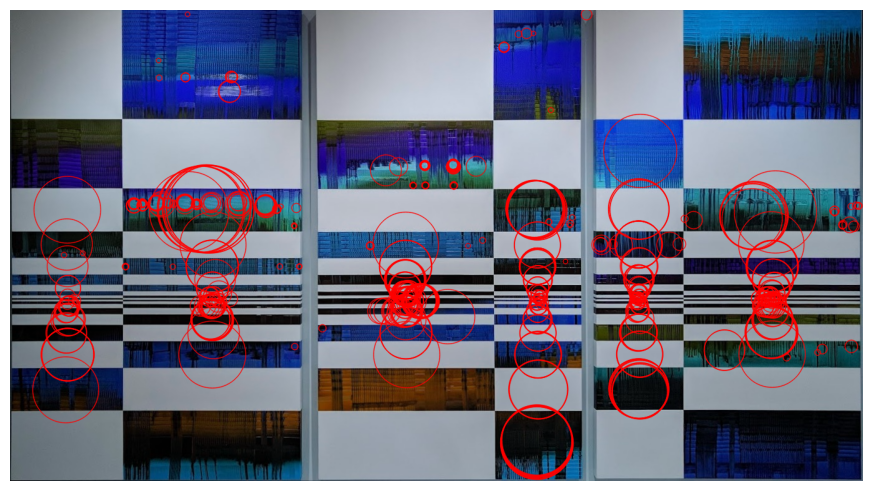

In [48]:
MSER_one_img("00000")

In [51]:
def AGAST_one_img(name):
       
    img = bbdd[name]
    new_img = img.copy()
    gray_img = cv2.cvtColor(new_img, cv2.COLOR_BGR2GRAY)
       
    agast = cv2.AgastFeatureDetector_create()
    kp = agast.detect(gray_img, None)
    
    result = cv2.drawKeypoints(new_img, kp, None, (255,0,0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    plt.imshow(result)

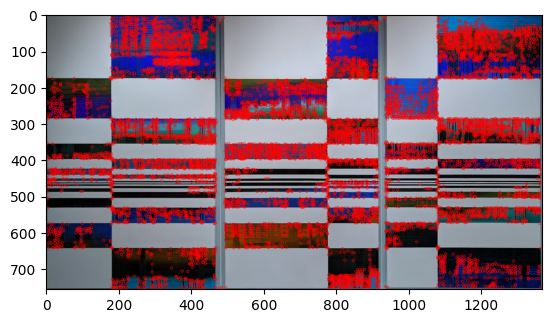

In [52]:
AGAST_one_img("00000")

In [53]:
def BRISK_img(img, mask):
    
    if img.ndim == 3: gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else: gray_img = img
        
    brisk = cv2.BRISK_create()
    kp, des = brisk.detectAndCompute(gray_img, mask)
        
    result = cv2.drawKeypoints(img, kp, None, (255,0,0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    
    plt.figure(figsize = (11, 11))
    plt.axis("off")
    plt.imshow(result)

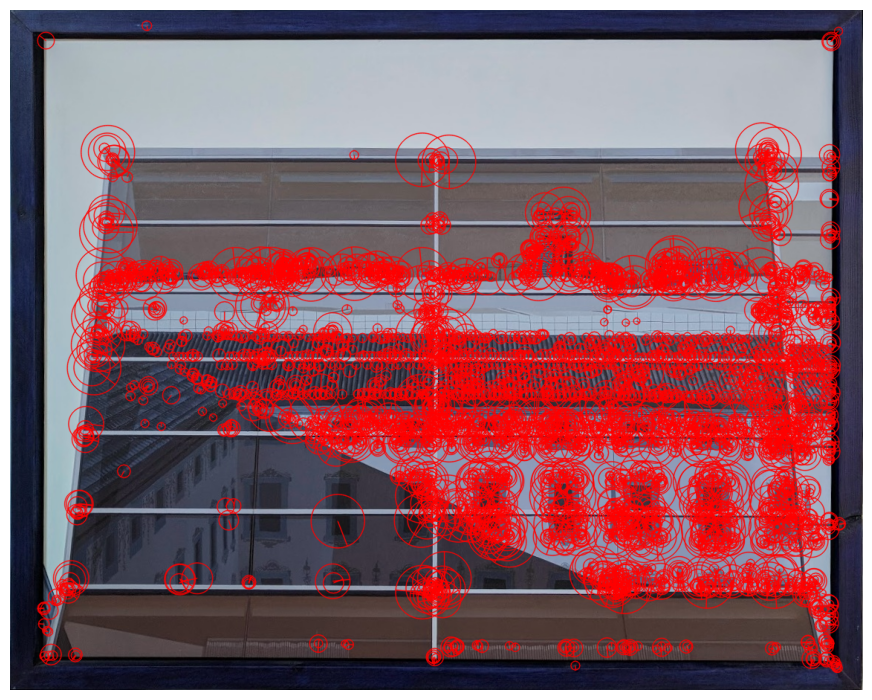

In [54]:
BRISK_img(bbdd["00257"], None)

In [55]:
# for BBDD
def compute_brisk_descriptors(bbdd):
    
    desc_dict = dict()
    
    for name, img in tqdm.tqdm(bbdd.items()):
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
       
        rect_mask_bbdd = np.full((gray_img.shape[0], gray_img.shape[1]), 255, dtype = np.uint8)

        border_size_height = int(0.2 * gray_img.shape[0])
        border_size_width = int(0.2 * gray_img.shape[1])
        
        rect_mask_bbdd[:border_size_height, :] = 0  # Top border
        rect_mask_bbdd[-border_size_height:, :] = 0  # Bottom border
        rect_mask_bbdd[:, :border_size_width] = 0  # Left border
        rect_mask_bbdd[:, -border_size_width:] = 0  # Right border
            
        brisk = cv2.BRISK_create()
        kp, des = brisk.detectAndCompute(gray_img, None)
         
        desc_dict[name] = (kp, des)
        
    return desc_dict

In [56]:
bbdd_brisk_median_masked = compute_brisk_descriptors(get_medians(bbdd))

100%|█████████████████████████████████████████████████████████████████████████████████| 287/287 [02:07<00:00,  2.25it/s]


# TASK 2

## Find tentative matches based on similarity of local appearance and verify matches 

### Tentative matches similarity metrics

#### Brute force

In [57]:
def brute_force(des_bbdd, des_qsd1, kp_bbdd, kp_qsd1, bbdd_img, qs_img, k = 2, dist_th = 0.05):
    

    bf=cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = bf.match(des_bbdd, des_qsd1)
    
    close_dists = []
    good_matches = []
    list_kp1 = []
    list_kp2 = []    
    for mat in matches:

        # Get the matching keypoints for each of the images
        img1_idx = mat.queryIdx #bbdd
        img2_idx = mat.trainIdx #qsd1

        # x - columns
        # y - rows
        # Get the coordinates
        (x1, y1) = kp_bbdd[img1_idx].pt
        (x2, y2) = kp_qsd1[img2_idx].pt

        # Append to each list
        list_kp1.append((x1, y1))
        list_kp2.append((x2, y2))

    dists = []
    close_dists = []
    good_matches = []
    for match_num in range(len(list_kp1)):
        x1, y1 = list_kp1[match_num]
        x2, y2 = list_kp2[match_num]

        x1 /= bbdd_img.shape[1]
        y1 /= bbdd_img.shape[0]

        x2 /= qs_img.shape[1]
        y2 /= qs_img.shape[0]

        #dist = np.sqrt((x1-x2)**2 + (y1-y2)**2)
        dist = np.abs(x1 - x2) + np.abs(y1 - y2)
        dists.append(dist)
        if dist < dist_th: 
            close_dists.append(dist)
            good_matches.append(matches[match_num])
    

 
    return good_matches

In [58]:
def FLANN(des1, des2, k = 2, ratio_thresh = 0.7):
    # FLANN parameters
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
    search_params = dict(checks=50)   # or pass empty dictionary
    
    #flann = cv2.FlannBasedMatcher(index_params, search_params)
    #matches = flann.knnMatch(des1, des2, k=2)
    
    matcher = cv2.DescriptorMatcher_create(cv2.DescriptorMatcher_FLANNBASED)
    matches = matcher.knnMatch(des1, des2, k=2)
    
    # Filter matches using the Lowe's ratio test
    ratio_thresh = ratio_thresh
    good_matches = []
    for m,n in matches:
        if m.distance < ratio_thresh * n.distance:
            good_matches.append(m)
            
    good_matches = sorted(good_matches, key = lambda x:x.distance)
            
    # print(f'Total Number of Features matches found are {len(good_matches)}')
 
    return good_matches

In [59]:
def apk(actual, predicted, k=10):
    if len(predicted)>k:
        predicted = predicted[:k]

    score = 0.0
    num_hits = 0.0

    for i,p in enumerate(predicted):
        if p in actual and p not in predicted[:i]:
            num_hits += 1.0
            score += num_hits / (i+1.0)

    if not actual:
        return 0.0

    return score / min(len(actual), k)

def mapk(actual, predicted, k=10):
    return np.mean([apk(a,p,k) for a,p in zip(actual, predicted)])

In [60]:
def add_list_level(input_list):
    out = []
    for ll in input_list:
        tmp = []
        for q in ll:
            tmp.append([q])
        out.append(tmp)
    return (out)

list_depth = lambda L: (isinstance(L, list) or isinstance(L, tuple)) and max(map(list_depth, L))+1

def compute_mapk(gt,hypo,k_val):

    hypo = list(hypo)
    if list_depth(hypo) == 2:
        hypo = add_list_level(hypo.copy())

    apk_list = []
    for ii,query in enumerate(gt):
        for jj,sq in enumerate(query):
            apk_val = 0.0
            if len(hypo[ii]) > jj:
                apk_val = apk([sq],hypo[ii][jj], k_val)
            apk_list.append(apk_val)
            
    return np.mean(apk_list)

In [64]:
def k_neighbours(dictionary, k=10, rev=False):
    result_dict = dict(sorted(dictionary.items(), key=lambda item: item[1], reverse=rev))
    return [int(keys) for keys,v in result_dict.items()][:k]

# Task 4

### Apply full processing pipeline to all QS and compute mapK

In [65]:
def image_matching(qs, bbdd, method = "ORB", metric = "brute_force", k = 10, dist_th = 0.05, min_matches = 20):
    
    if method == "SIFT": bbdd_method = bbdd_sift
    #elif method == "ORB": bbdd_method = bbdd_orb
    elif method == "ORB": bbdd_method = bbdd_orb_median_masked
    
    all_results = []
    
    for name, picture in qs.items():
        
        # ESTO NO LO TENIAMOS PUESTO ANTES, LO DE CALCULAR EL MEDIAN DE CADA IMAGEN
        median_picture = cv2.medianBlur(picture, 3)
        
        gray_picture = cv2.medianBlur(median_picture, 3)
        #sharpened_image = cv2.filter2D(image, -1, kernel)
        # we first have to divide the picture into paintings
        tls_and_brs = divide_paintings_w2(median_picture)[0]
        
        print("{} ---------------".format(name))
            
        picture_results = []
        for painting_tl_and_br in tls_and_brs:
            # we are going to crop the picture to get each painting
            painting = median_picture[painting_tl_and_br[1] : painting_tl_and_br[3]+1, painting_tl_and_br[0] : painting_tl_and_br[2]+1]

            # we have to mask the text boxes
            not_rect_mask = get_name_boxs(painting)
            tl, br = get_tl_and_br(not_rect_mask)
            tr = (br[0], tl[1])
            bl = (tl[0], br[1])
            rect_mask = np.zeros((painting.shape[0], painting.shape[1]), dtype = np.uint8)
            roi_corners = np.array([tl, tr, br, bl], dtype = np.int32)
            cv2.fillPoly(rect_mask, [roi_corners], 255)
            rect_mask = (255 - rect_mask)
            
            n_pixels = cv2.countNonZero(rect_mask)
            if n_pixels < painting.shape[0]*painting.shape[1]*.7: 
                print("Mascara demasiado grande, no le hace caso")
                rect_mask = np.full((painting.shape[0], painting.shape[1]), 255, dtype = np.uint8)
            for i in range(len(rect_mask)):
                for j in range(len(rect_mask[0])):
                    if (i<0.2*len(rect_mask)) or (i>0.8*len(rect_mask)): rect_mask[i][j] = 0
                    elif (j<0.2*len(rect_mask[0])) or (j>0.8*len(rect_mask[0])): rect_mask[i][j] = 0
            
            matches_dict = dict()
            
            for name_bb, kp_des in bbdd_method.items():
                # if we do resize, the 246 fails resizing with the qsd1 28 or 29
                #if name_bb == '00246':
                #    matches_dict[name_bb] = 0
                #    continue
                if kp_des is None:
                    dists = []
                    close_dists = []
                    print(f"len dists: {len(dists)} , len close_dists: {len(close_dists)}")
                    continue
                    
                kp_bbdd, des_bbdd = kp_des
            
                # if we want to resize
                """
                h, w, c = bbdd[name_bb].shape
                resized_painting = cv2.resize(painting, (w, h))
                if rect_mask is not None: 
                    resized_mask = cv2.resize(rect_mask, (w, h))
                else: 
                    resized_mask = None
                """
                   
                if method == "SIFT": kp_qsd1, des_qsd1 = SIFT_img(painting, rect_mask)
                elif method == "ORB": kp_qsd1, des_qsd1 = ORB_img(painting, rect_mask) 
                    
                # PARA LOS MATCHERS, PRIMERO PASARLE BBDD Y LUEGO QSD1
                if metric == "brute_force": 
                    num_matches = len(brute_force(des_bbdd, des_qsd1, kp_bbdd, kp_qsd1, bbdd[name_bb], painting, dist_th = dist_th))
                    matches_dict[name_bb] = num_matches
                    #print(num_matches)
                elif metric == "FLANN": matches_dict[name_bb] = len(FLANN(bbdd_img_des, des))
            
            # rev = True, porque necesitamos el mayor número de matches
            closests = k_neighbours(matches_dict, k=k, rev=True)
            print(matches_dict)
            
            if matches_dict[str(closests[0]).zfill(5)]<min_matches:
                closests = [-1]
            
            #print(f"Closest {k} images: {closests}, and the max number of matches: {matches_dict[str(closests[0]).zfill(5)]} ") 
            print(f"Closest {k} images: {closests}")
                
            # append topK to the picture results
            picture_results.append(closests)
            
        # La img "00006" tls_and_brs está vacío, pongo array de -1's
        if len(tls_and_brs) == 0:
            not_rect_mask = get_name_boxs(median_picture)
            tl, br = get_tl_and_br(not_rect_mask)
            tr = (br[0], tl[1])
            bl = (tl[0], br[1])
            rect_mask = np.zeros((median_picture.shape[0], median_picture.shape[1]), dtype = np.uint8)
            roi_corners = np.array([tl, tr, br, bl], dtype = np.int32)
            cv2.fillPoly(rect_mask, [roi_corners], 255)
            rect_mask = (255 - rect_mask)
            matches_dict = dict()
            
            n_pixels = cv2.countNonZero(rect_mask)
            if n_pixels < painting.shape[0]*painting.shape[1]*.7: 
                print("Mascara demasiado grande, no le hace caso")
                rect_mask = np.full((painting.shape[0], painting.shape[1]), 255, dtype = np.uint8)
            for i in range(len(rect_mask)):
                for j in range(len(rect_mask[0])):
                    if (i<0.2*len(rect_mask)) or (i>0.8*len(rect_mask)): rect_mask[i][j] = 0
                    elif (j<0.2*len(rect_mask[0])) or (j>0.8*len(rect_mask[0])): rect_mask[i][j] = 0
            
            for name_bb, kp_des in bbdd_method.items():
            
                if kp_des is None:
                    dists = []
                    close_dists = []
                    print(f"len dists: {len(dists)} , len close_dists: {len(close_dists)}")
                    continue
                    
                kp_bbdd, des_bbdd = kp_des
            
                h, w, c = bbdd[name_bb].shape
                resized_painting = cv2.resize(median_picture, (w, h))
                if rect_mask is not None: 
                    resized_mask = cv2.resize(rect_mask, (w, h))
                else: 
                    resized_mask = None
                    
                if method == "SIFT": kp_qsd1, des_qsd1 = SIFT_img(painting, rect_mask)
                elif method == "ORB": kp_qsd1, des_qsd1 = ORB_img(painting, rect_mask) 
                    
                if metric == "brute_force": 
                    num_matches = len(brute_force(des_bbdd, des_qsd1, kp_bbdd, kp_qsd1, bbdd[name_bb], painting, dist_th = dist_th))
                    matches_dict[name_bb] = num_matches
                    #print(num_matches)
                elif metric == "FLANN": matches_dict[name_bb] = len(FLANN(bbdd_img_des, des))
            
            # rev = True, porque necesitamos el mayor número de matches
            closests = k_neighbours(matches_dict, k=k, rev=True)
            print(matches_dict)
            if matches_dict[str(closests[0]).zfill(5)]<min_matches:
                closests = [-1]
            
            #print(f"Closest {k} images: {closests}, and the max number of matches: {matches_dict[str(closests[0]).zfill(5)]} ") 
            print(f"Closest {k} images: {closests}")
                
            # append topK to the picture results
            picture_results.append(closests)
            
        if len(tls_and_brs) == 0:
            print("tls_and_brs for image {} is empty! inserting -1s\n".format(name))
            all_results.append([np.array([-1] * k).tolist()])
            continue    
            
        # append picture results to all_results
        all_results.append(picture_results)
        
    return all_results

In [66]:
result = image_matching(qsd1_w4, bbdd, metric = "brute_force", method = "ORB", dist_th = 0.1)

00000 ---------------
Mascara demasiado grande, no le hace caso
{'00000': 0, '00001': 0, '00002': 12, '00003': 9, '00004': 10, '00005': 6, '00006': 2, '00007': 12, '00008': 8, '00009': 3, '00010': 4, '00011': 8, '00012': 5, '00013': 1, '00014': 7, '00015': 8, '00016': 7, '00017': 2, '00018': 3, '00019': 9, '00020': 4, '00021': 1, '00022': 9, '00023': 6, '00024': 3, '00025': 5, '00026': 6, '00027': 5, '00028': 6, '00029': 2, '00030': 13, '00031': 8, '00032': 2, '00033': 2, '00034': 23, '00035': 11, '00036': 0, '00037': 8, '00038': 2, '00039': 9, '00040': 6, '00041': 10, '00042': 8, '00043': 10, '00044': 2, '00045': 8, '00046': 6, '00047': 0, '00048': 4, '00049': 1, '00050': 8, '00051': 9, '00052': 0, '00053': 10, '00054': 16, '00055': 13, '00056': 6, '00057': 14, '00058': 2, '00059': 8, '00060': 11, '00061': 7, '00062': 10, '00063': 6, '00064': 6, '00065': 7, '00066': 8, '00067': 8, '00068': 6, '00069': 6, '00070': 12, '00071': 8, '00072': 5, '00073': 8, '00074': 5, '00075': 4, '00076':

{'00000': 0, '00001': 0, '00002': 1, '00003': 0, '00004': 1, '00005': 0, '00006': 0, '00007': 3, '00008': 2, '00009': 1, '00010': 0, '00011': 4, '00012': 0, '00013': 0, '00014': 0, '00015': 0, '00016': 0, '00017': 0, '00018': 0, '00019': 3, '00020': 3, '00021': 1, '00022': 1, '00023': 0, '00024': 0, '00025': 1, '00026': 0, '00027': 0, '00028': 2, '00029': 2, '00030': 0, '00031': 0, '00032': 0, '00033': 1, '00034': 0, '00035': 0, '00036': 0, '00037': 2, '00038': 1, '00039': 0, '00040': 1, '00041': 50, '00042': 0, '00043': 1, '00044': 1, '00045': 0, '00046': 1, '00047': 3, '00048': 1, '00049': 0, '00050': 1, '00051': 6, '00052': 0, '00053': 6, '00054': 1, '00055': 0, '00056': 3, '00057': 2, '00058': 0, '00059': 5, '00060': 0, '00061': 2, '00062': 0, '00063': 0, '00064': 1, '00065': 4, '00066': 0, '00067': 0, '00068': 1, '00069': 0, '00070': 0, '00071': 3, '00072': 0, '00073': 0, '00074': 1, '00075': 1, '00076': 1, '00077': 0, '00078': 0, '00079': 0, '00080': 0, '00081': 1, '00082': 1, '0

{'00000': 4, '00001': 0, '00002': 0, '00003': 2, '00004': 0, '00005': 0, '00006': 0, '00007': 0, '00008': 0, '00009': 0, '00010': 1, '00011': 3, '00012': 1, '00013': 4, '00014': 0, '00015': 0, '00016': 2, '00017': 0, '00018': 0, '00019': 2, '00020': 1, '00021': 1, '00022': 3, '00023': 1, '00024': 0, '00025': 1, '00026': 0, '00027': 2, '00028': 3, '00029': 1, '00030': 2, '00031': 1, '00032': 4, '00033': 0, '00034': 0, '00035': 38, '00036': 0, '00037': 1, '00038': 0, '00039': 0, '00040': 0, '00041': 3, '00042': 2, '00043': 1, '00044': 0, '00045': 3, '00046': 2, '00047': 0, '00048': 1, '00049': 1, '00050': 0, '00051': 0, '00052': 0, '00053': 1, '00054': 1, '00055': 0, '00056': 3, '00057': 2, '00058': 0, '00059': 1, '00060': 0, '00061': 2, '00062': 2, '00063': 0, '00064': 1, '00065': 1, '00066': 3, '00067': 2, '00068': 0, '00069': 1, '00070': 0, '00071': 1, '00072': 0, '00073': 2, '00074': 2, '00075': 1, '00076': 0, '00077': 2, '00078': 3, '00079': 0, '00080': 0, '00081': 0, '00082': 3, '0

{'00000': 0, '00001': 0, '00002': 0, '00003': 2, '00004': 0, '00005': 3, '00006': 3, '00007': 4, '00008': 1, '00009': 2, '00010': 3, '00011': 3, '00012': 1, '00013': 2, '00014': 0, '00015': 0, '00016': 1, '00017': 0, '00018': 0, '00019': 0, '00020': 3, '00021': 0, '00022': 1, '00023': 3, '00024': 1, '00025': 0, '00026': 0, '00027': 3, '00028': 0, '00029': 0, '00030': 0, '00031': 0, '00032': 1, '00033': 1, '00034': 1, '00035': 2, '00036': 0, '00037': 0, '00038': 0, '00039': 1, '00040': 0, '00041': 0, '00042': 0, '00043': 1, '00044': 1, '00045': 0, '00046': 1, '00047': 0, '00048': 4, '00049': 0, '00050': 1, '00051': 0, '00052': 3, '00053': 0, '00054': 0, '00055': 0, '00056': 0, '00057': 3, '00058': 1, '00059': 5, '00060': 2, '00061': 6, '00062': 1, '00063': 0, '00064': 1, '00065': 0, '00066': 0, '00067': 0, '00068': 1, '00069': 0, '00070': 1, '00071': 1, '00072': 0, '00073': 0, '00074': 1, '00075': 2, '00076': 1, '00077': 0, '00078': 1, '00079': 2, '00080': 0, '00081': 0, '00082': 0, '00

{'00000': 0, '00001': 0, '00002': 0, '00003': 0, '00004': 0, '00005': 3, '00006': 0, '00007': 2, '00008': 0, '00009': 0, '00010': 0, '00011': 1, '00012': 1, '00013': 0, '00014': 0, '00015': 0, '00016': 1, '00017': 0, '00018': 1, '00019': 3, '00020': 0, '00021': 0, '00022': 1, '00023': 0, '00024': 1, '00025': 0, '00026': 0, '00027': 0, '00028': 0, '00029': 2, '00030': 1, '00031': 4, '00032': 0, '00033': 1, '00034': 5, '00035': 2, '00036': 0, '00037': 0, '00038': 4, '00039': 1, '00040': 1, '00041': 0, '00042': 3, '00043': 0, '00044': 0, '00045': 0, '00046': 0, '00047': 3, '00048': 0, '00049': 1, '00050': 2, '00051': 0, '00052': 0, '00053': 0, '00054': 0, '00055': 0, '00056': 2, '00057': 2, '00058': 0, '00059': 0, '00060': 0, '00061': 0, '00062': 0, '00063': 0, '00064': 0, '00065': 0, '00066': 1, '00067': 0, '00068': 0, '00069': 1, '00070': 0, '00071': 2, '00072': 0, '00073': 3, '00074': 1, '00075': 1, '00076': 1, '00077': 1, '00078': 1, '00079': 2, '00080': 3, '00081': 0, '00082': 1, '00

{'00000': 0, '00001': 0, '00002': 0, '00003': 2, '00004': 0, '00005': 0, '00006': 1, '00007': 0, '00008': 0, '00009': 0, '00010': 0, '00011': 0, '00012': 0, '00013': 0, '00014': 0, '00015': 6, '00016': 1, '00017': 0, '00018': 0, '00019': 0, '00020': 0, '00021': 1, '00022': 0, '00023': 20, '00024': 1, '00025': 0, '00026': 0, '00027': 0, '00028': 1, '00029': 0, '00030': 0, '00031': 1, '00032': 0, '00033': 0, '00034': 0, '00035': 1, '00036': 0, '00037': 0, '00038': 1, '00039': 2, '00040': 0, '00041': 0, '00042': 1, '00043': 0, '00044': 1, '00045': 0, '00046': 0, '00047': 0, '00048': 1, '00049': 1, '00050': 0, '00051': 1, '00052': 0, '00053': 1, '00054': 0, '00055': 0, '00056': 0, '00057': 1, '00058': 1, '00059': 0, '00060': 2, '00061': 6, '00062': 1, '00063': 0, '00064': 0, '00065': 0, '00066': 0, '00067': 0, '00068': 1, '00069': 0, '00070': 2, '00071': 1, '00072': 0, '00073': 0, '00074': 0, '00075': 1, '00076': 0, '00077': 0, '00078': 0, '00079': 0, '00080': 2, '00081': 1, '00082': 0, '0

{'00000': 0, '00001': 0, '00002': 0, '00003': 0, '00004': 0, '00005': 0, '00006': 0, '00007': 0, '00008': 0, '00009': 2, '00010': 0, '00011': 1, '00012': 0, '00013': 2, '00014': 0, '00015': 0, '00016': 2, '00017': 0, '00018': 2, '00019': 1, '00020': 1, '00021': 1, '00022': 1, '00023': 0, '00024': 2, '00025': 0, '00026': 2, '00027': 1, '00028': 1, '00029': 1, '00030': 0, '00031': 1, '00032': 2, '00033': 1, '00034': 0, '00035': 2, '00036': 0, '00037': 0, '00038': 0, '00039': 0, '00040': 0, '00041': 0, '00042': 0, '00043': 0, '00044': 2, '00045': 0, '00046': 1, '00047': 0, '00048': 3, '00049': 1, '00050': 2, '00051': 0, '00052': 0, '00053': 0, '00054': 1, '00055': 0, '00056': 3, '00057': 0, '00058': 2, '00059': 1, '00060': 0, '00061': 0, '00062': 3, '00063': 1, '00064': 0, '00065': 0, '00066': 0, '00067': 0, '00068': 0, '00069': 0, '00070': 0, '00071': 1, '00072': 0, '00073': 2, '00074': 0, '00075': 3, '00076': 0, '00077': 4, '00078': 1, '00079': 0, '00080': 3, '00081': 3, '00082': 6, '00

{'00000': 1, '00001': 0, '00002': 1, '00003': 3, '00004': 0, '00005': 0, '00006': 0, '00007': 0, '00008': 2, '00009': 1, '00010': 1, '00011': 2, '00012': 2, '00013': 0, '00014': 2, '00015': 1, '00016': 0, '00017': 2, '00018': 0, '00019': 1, '00020': 2, '00021': 0, '00022': 0, '00023': 1, '00024': 0, '00025': 1, '00026': 0, '00027': 1, '00028': 1, '00029': 1, '00030': 0, '00031': 0, '00032': 0, '00033': 1, '00034': 2, '00035': 0, '00036': 0, '00037': 2, '00038': 0, '00039': 0, '00040': 3, '00041': 4, '00042': 0, '00043': 3, '00044': 1, '00045': 2, '00046': 2, '00047': 0, '00048': 0, '00049': 0, '00050': 1, '00051': 2, '00052': 0, '00053': 1, '00054': 1, '00055': 1, '00056': 0, '00057': 2, '00058': 2, '00059': 0, '00060': 0, '00061': 2, '00062': 2, '00063': 0, '00064': 1, '00065': 1, '00066': 2, '00067': 2, '00068': 0, '00069': 1, '00070': 0, '00071': 0, '00072': 0, '00073': 3, '00074': 1, '00075': 0, '00076': 2, '00077': 1, '00078': 0, '00079': 2, '00080': 0, '00081': 1, '00082': 1, '00

00024 ---------------
{'00000': 0, '00001': 0, '00002': 0, '00003': 0, '00004': 0, '00005': 0, '00006': 0, '00007': 1, '00008': 0, '00009': 0, '00010': 2, '00011': 1, '00012': 0, '00013': 1, '00014': 2, '00015': 0, '00016': 1, '00017': 1, '00018': 0, '00019': 1, '00020': 1, '00021': 0, '00022': 0, '00023': 1, '00024': 1, '00025': 0, '00026': 1, '00027': 1, '00028': 5, '00029': 0, '00030': 0, '00031': 4, '00032': 1, '00033': 0, '00034': 2, '00035': 0, '00036': 2, '00037': 0, '00038': 0, '00039': 0, '00040': 0, '00041': 1, '00042': 1, '00043': 0, '00044': 2, '00045': 0, '00046': 2, '00047': 1, '00048': 1, '00049': 2, '00050': 1, '00051': 1, '00052': 0, '00053': 0, '00054': 0, '00055': 0, '00056': 0, '00057': 1, '00058': 1, '00059': 0, '00060': 0, '00061': 1, '00062': 3, '00063': 0, '00064': 1, '00065': 1, '00066': 0, '00067': 0, '00068': 0, '00069': 1, '00070': 4, '00071': 0, '00072': 0, '00073': 0, '00074': 1, '00075': 0, '00076': 0, '00077': 2, '00078': 1, '00079': 1, '00080': 1, '0008

{'00000': 0, '00001': 0, '00002': 1, '00003': 0, '00004': 1, '00005': 0, '00006': 1, '00007': 0, '00008': 3, '00009': 2, '00010': 0, '00011': 3, '00012': 0, '00013': 0, '00014': 1, '00015': 0, '00016': 0, '00017': 0, '00018': 5, '00019': 0, '00020': 2, '00021': 1, '00022': 1, '00023': 2, '00024': 0, '00025': 1, '00026': 0, '00027': 2, '00028': 0, '00029': 1, '00030': 2, '00031': 1, '00032': 0, '00033': 2, '00034': 1, '00035': 1, '00036': 0, '00037': 0, '00038': 1, '00039': 1, '00040': 1, '00041': 5, '00042': 1, '00043': 0, '00044': 3, '00045': 0, '00046': 0, '00047': 3, '00048': 1, '00049': 0, '00050': 4, '00051': 1, '00052': 1, '00053': 3, '00054': 2, '00055': 1, '00056': 1, '00057': 1, '00058': 0, '00059': 3, '00060': 0, '00061': 2, '00062': 1, '00063': 0, '00064': 3, '00065': 2, '00066': 1, '00067': 1, '00068': 0, '00069': 0, '00070': 0, '00071': 1, '00072': 0, '00073': 1, '00074': 1, '00075': 3, '00076': 1, '00077': 1, '00078': 0, '00079': 2, '00080': 0, '00081': 1, '00082': 1, '00

00029 ---------------
{'00000': 0, '00001': 0, '00002': 2, '00003': 0, '00004': 0, '00005': 1, '00006': 0, '00007': 0, '00008': 0, '00009': 0, '00010': 2, '00011': 2, '00012': 0, '00013': 0, '00014': 0, '00015': 2, '00016': 3, '00017': 9, '00018': 2, '00019': 3, '00020': 3, '00021': 1, '00022': 1, '00023': 2, '00024': 1, '00025': 1, '00026': 0, '00027': 0, '00028': 0, '00029': 0, '00030': 1, '00031': 1, '00032': 3, '00033': 1, '00034': 0, '00035': 0, '00036': 0, '00037': 0, '00038': 0, '00039': 0, '00040': 0, '00041': 2, '00042': 0, '00043': 1, '00044': 0, '00045': 1, '00046': 0, '00047': 2, '00048': 3, '00049': 0, '00050': 2, '00051': 2, '00052': 0, '00053': 3, '00054': 3, '00055': 0, '00056': 0, '00057': 1, '00058': 1, '00059': 4, '00060': 0, '00061': 1, '00062': 2, '00063': 0, '00064': 0, '00065': 2, '00066': 1, '00067': 0, '00068': 0, '00069': 3, '00070': 0, '00071': 1, '00072': 0, '00073': 0, '00074': 0, '00075': 0, '00076': 0, '00077': 0, '00078': 0, '00079': 2, '00080': 1, '0008

In [38]:
result = image_matching(qsd1_w4, bbdd, metric = "brute_force", method = "ORB", dist_th = 0.1) # <20

00000 ---------------
Mascara demasiado grande, no le hace caso
{'00000': 0, '00001': 0, '00002': 2, '00003': 0, '00004': 3, '00005': 0, '00006': 2, '00007': 1, '00008': 0, '00009': 0, '00010': 0, '00011': 0, '00012': 1, '00013': 0, '00014': 0, '00015': 0, '00016': 0, '00017': 1, '00018': 0, '00019': 0, '00020': 0, '00021': 0, '00022': 0, '00023': 1, '00024': 0, '00025': 0, '00026': 0, '00027': 2, '00028': 2, '00029': 1, '00030': 1, '00031': 2, '00032': 1, '00033': 0, '00034': 5, '00035': 1, '00036': 0, '00037': 0, '00038': 0, '00039': 1, '00040': 1, '00041': 4, '00042': 1, '00043': 1, '00044': 0, '00045': 3, '00046': 1, '00047': 0, '00048': 0, '00049': 0, '00050': 3, '00051': 1, '00052': 0, '00053': 1, '00054': 1, '00055': 4, '00056': 1, '00057': 0, '00058': 0, '00059': 1, '00060': 0, '00061': 0, '00062': 2, '00063': 0, '00064': 2, '00065': 0, '00066': 0, '00067': 0, '00068': 3, '00069': 0, '00070': 2, '00071': 1, '00072': 0, '00073': 2, '00074': 0, '00075': 0, '00076': 1, '00077': 2,

00003 ---------------
Mascara demasiado grande, no le hace caso
{'00000': 0, '00001': 0, '00002': 0, '00003': 2, '00004': 1, '00005': 0, '00006': 0, '00007': 3, '00008': 0, '00009': 0, '00010': 0, '00011': 0, '00012': 3, '00013': 1, '00014': 0, '00015': 1, '00016': 0, '00017': 0, '00018': 0, '00019': 0, '00020': 0, '00021': 0, '00022': 0, '00023': 0, '00024': 1, '00025': 2, '00026': 0, '00027': 0, '00028': 1, '00029': 1, '00030': 0, '00031': 0, '00032': 1, '00033': 1, '00034': 2, '00035': 0, '00036': 1, '00037': 0, '00038': 2, '00039': 1, '00040': 0, '00041': 0, '00042': 0, '00043': 0, '00044': 0, '00045': 0, '00046': 0, '00047': 1, '00048': 0, '00049': 0, '00050': 0, '00051': 0, '00052': 0, '00053': 0, '00054': 1, '00055': 1, '00056': 1, '00057': 0, '00058': 1, '00059': 0, '00060': 3, '00061': 0, '00062': 0, '00063': 0, '00064': 0, '00065': 0, '00066': 0, '00067': 0, '00068': 0, '00069': 0, '00070': 0, '00071': 1, '00072': 2, '00073': 0, '00074': 0, '00075': 0, '00076': 1, '00077': 0,

{'00000': 0, '00001': 0, '00002': 0, '00003': 0, '00004': 4, '00005': 1, '00006': 0, '00007': 1, '00008': 0, '00009': 0, '00010': 0, '00011': 0, '00012': 0, '00013': 1, '00014': 0, '00015': 1, '00016': 0, '00017': 0, '00018': 0, '00019': 1, '00020': 0, '00021': 3, '00022': 0, '00023': 1, '00024': 0, '00025': 0, '00026': 0, '00027': 0, '00028': 2, '00029': 0, '00030': 0, '00031': 0, '00032': 0, '00033': 0, '00034': 0, '00035': 0, '00036': 0, '00037': 0, '00038': 0, '00039': 0, '00040': 0, '00041': 1, '00042': 2, '00043': 1, '00044': 0, '00045': 2, '00046': 1, '00047': 1, '00048': 0, '00049': 1, '00050': 1, '00051': 1, '00052': 0, '00053': 0, '00054': 2, '00055': 1, '00056': 0, '00057': 0, '00058': 1, '00059': 0, '00060': 1, '00061': 2, '00062': 0, '00063': 4, '00064': 0, '00065': 0, '00066': 1, '00067': 0, '00068': 1, '00069': 0, '00070': 1, '00071': 2, '00072': 1, '00073': 1, '00074': 1, '00075': 0, '00076': 0, '00077': 1, '00078': 0, '00079': 1, '00080': 1, '00081': 1, '00082': 2, '00

{'00000': 0, '00001': 0, '00002': 1, '00003': 0, '00004': 1, '00005': 0, '00006': 0, '00007': 3, '00008': 2, '00009': 1, '00010': 0, '00011': 4, '00012': 0, '00013': 0, '00014': 0, '00015': 0, '00016': 0, '00017': 0, '00018': 0, '00019': 3, '00020': 3, '00021': 1, '00022': 1, '00023': 0, '00024': 0, '00025': 1, '00026': 0, '00027': 0, '00028': 2, '00029': 2, '00030': 0, '00031': 0, '00032': 0, '00033': 1, '00034': 0, '00035': 0, '00036': 0, '00037': 2, '00038': 1, '00039': 0, '00040': 1, '00041': 50, '00042': 0, '00043': 1, '00044': 1, '00045': 0, '00046': 1, '00047': 3, '00048': 1, '00049': 0, '00050': 1, '00051': 6, '00052': 0, '00053': 6, '00054': 1, '00055': 0, '00056': 3, '00057': 2, '00058': 0, '00059': 5, '00060': 0, '00061': 2, '00062': 0, '00063': 0, '00064': 1, '00065': 4, '00066': 0, '00067': 0, '00068': 1, '00069': 0, '00070': 0, '00071': 3, '00072': 0, '00073': 0, '00074': 1, '00075': 1, '00076': 1, '00077': 0, '00078': 0, '00079': 0, '00080': 0, '00081': 1, '00082': 1, '0

{'00000': 4, '00001': 0, '00002': 0, '00003': 2, '00004': 0, '00005': 0, '00006': 0, '00007': 0, '00008': 0, '00009': 0, '00010': 1, '00011': 3, '00012': 1, '00013': 4, '00014': 0, '00015': 0, '00016': 2, '00017': 0, '00018': 0, '00019': 2, '00020': 1, '00021': 1, '00022': 3, '00023': 1, '00024': 0, '00025': 1, '00026': 0, '00027': 2, '00028': 3, '00029': 1, '00030': 2, '00031': 1, '00032': 4, '00033': 0, '00034': 0, '00035': 38, '00036': 0, '00037': 1, '00038': 0, '00039': 0, '00040': 0, '00041': 3, '00042': 2, '00043': 1, '00044': 0, '00045': 3, '00046': 2, '00047': 0, '00048': 1, '00049': 1, '00050': 0, '00051': 0, '00052': 0, '00053': 1, '00054': 1, '00055': 0, '00056': 3, '00057': 2, '00058': 0, '00059': 1, '00060': 0, '00061': 2, '00062': 2, '00063': 0, '00064': 1, '00065': 1, '00066': 3, '00067': 2, '00068': 0, '00069': 1, '00070': 0, '00071': 1, '00072': 0, '00073': 2, '00074': 2, '00075': 1, '00076': 0, '00077': 2, '00078': 3, '00079': 0, '00080': 0, '00081': 0, '00082': 3, '0

{'00000': 0, '00001': 0, '00002': 0, '00003': 2, '00004': 0, '00005': 3, '00006': 3, '00007': 4, '00008': 1, '00009': 2, '00010': 3, '00011': 3, '00012': 1, '00013': 2, '00014': 0, '00015': 0, '00016': 1, '00017': 0, '00018': 0, '00019': 0, '00020': 3, '00021': 0, '00022': 1, '00023': 3, '00024': 1, '00025': 0, '00026': 0, '00027': 3, '00028': 0, '00029': 0, '00030': 0, '00031': 0, '00032': 1, '00033': 1, '00034': 1, '00035': 2, '00036': 0, '00037': 0, '00038': 0, '00039': 1, '00040': 0, '00041': 0, '00042': 0, '00043': 1, '00044': 1, '00045': 0, '00046': 1, '00047': 0, '00048': 4, '00049': 0, '00050': 1, '00051': 0, '00052': 3, '00053': 0, '00054': 0, '00055': 0, '00056': 0, '00057': 3, '00058': 1, '00059': 5, '00060': 2, '00061': 6, '00062': 1, '00063': 0, '00064': 1, '00065': 0, '00066': 0, '00067': 0, '00068': 1, '00069': 0, '00070': 1, '00071': 1, '00072': 0, '00073': 0, '00074': 1, '00075': 2, '00076': 1, '00077': 0, '00078': 1, '00079': 2, '00080': 0, '00081': 0, '00082': 0, '00

{'00000': 0, '00001': 0, '00002': 0, '00003': 0, '00004': 0, '00005': 3, '00006': 0, '00007': 2, '00008': 0, '00009': 0, '00010': 0, '00011': 1, '00012': 1, '00013': 0, '00014': 0, '00015': 0, '00016': 1, '00017': 0, '00018': 1, '00019': 3, '00020': 0, '00021': 0, '00022': 1, '00023': 0, '00024': 1, '00025': 0, '00026': 0, '00027': 0, '00028': 0, '00029': 2, '00030': 1, '00031': 4, '00032': 0, '00033': 1, '00034': 5, '00035': 2, '00036': 0, '00037': 0, '00038': 4, '00039': 1, '00040': 1, '00041': 0, '00042': 3, '00043': 0, '00044': 0, '00045': 0, '00046': 0, '00047': 3, '00048': 0, '00049': 1, '00050': 2, '00051': 0, '00052': 0, '00053': 0, '00054': 0, '00055': 0, '00056': 2, '00057': 2, '00058': 0, '00059': 0, '00060': 0, '00061': 0, '00062': 0, '00063': 0, '00064': 0, '00065': 0, '00066': 1, '00067': 0, '00068': 0, '00069': 1, '00070': 0, '00071': 2, '00072': 0, '00073': 3, '00074': 1, '00075': 1, '00076': 1, '00077': 1, '00078': 1, '00079': 2, '00080': 3, '00081': 0, '00082': 1, '00

{'00000': 0, '00001': 0, '00002': 0, '00003': 2, '00004': 0, '00005': 0, '00006': 1, '00007': 0, '00008': 0, '00009': 0, '00010': 0, '00011': 0, '00012': 0, '00013': 0, '00014': 0, '00015': 6, '00016': 1, '00017': 0, '00018': 0, '00019': 0, '00020': 0, '00021': 1, '00022': 0, '00023': 20, '00024': 1, '00025': 0, '00026': 0, '00027': 0, '00028': 1, '00029': 0, '00030': 0, '00031': 1, '00032': 0, '00033': 0, '00034': 0, '00035': 1, '00036': 0, '00037': 0, '00038': 1, '00039': 2, '00040': 0, '00041': 0, '00042': 1, '00043': 0, '00044': 1, '00045': 0, '00046': 0, '00047': 0, '00048': 1, '00049': 1, '00050': 0, '00051': 1, '00052': 0, '00053': 1, '00054': 0, '00055': 0, '00056': 0, '00057': 1, '00058': 1, '00059': 0, '00060': 2, '00061': 6, '00062': 1, '00063': 0, '00064': 0, '00065': 0, '00066': 0, '00067': 0, '00068': 1, '00069': 0, '00070': 2, '00071': 1, '00072': 0, '00073': 0, '00074': 0, '00075': 1, '00076': 0, '00077': 0, '00078': 0, '00079': 0, '00080': 2, '00081': 1, '00082': 0, '0

{'00000': 0, '00001': 0, '00002': 0, '00003': 0, '00004': 0, '00005': 0, '00006': 0, '00007': 0, '00008': 0, '00009': 2, '00010': 0, '00011': 1, '00012': 0, '00013': 2, '00014': 0, '00015': 0, '00016': 2, '00017': 0, '00018': 2, '00019': 1, '00020': 1, '00021': 1, '00022': 1, '00023': 0, '00024': 2, '00025': 0, '00026': 2, '00027': 1, '00028': 1, '00029': 1, '00030': 0, '00031': 1, '00032': 2, '00033': 1, '00034': 0, '00035': 2, '00036': 0, '00037': 0, '00038': 0, '00039': 0, '00040': 0, '00041': 0, '00042': 0, '00043': 0, '00044': 2, '00045': 0, '00046': 1, '00047': 0, '00048': 3, '00049': 1, '00050': 2, '00051': 0, '00052': 0, '00053': 0, '00054': 1, '00055': 0, '00056': 3, '00057': 0, '00058': 2, '00059': 1, '00060': 0, '00061': 0, '00062': 3, '00063': 1, '00064': 0, '00065': 0, '00066': 0, '00067': 0, '00068': 0, '00069': 0, '00070': 0, '00071': 1, '00072': 0, '00073': 2, '00074': 0, '00075': 3, '00076': 0, '00077': 4, '00078': 1, '00079': 0, '00080': 3, '00081': 3, '00082': 6, '00

{'00000': 1, '00001': 0, '00002': 1, '00003': 3, '00004': 0, '00005': 0, '00006': 0, '00007': 0, '00008': 2, '00009': 1, '00010': 1, '00011': 2, '00012': 2, '00013': 0, '00014': 2, '00015': 1, '00016': 0, '00017': 2, '00018': 0, '00019': 1, '00020': 2, '00021': 0, '00022': 0, '00023': 1, '00024': 0, '00025': 1, '00026': 0, '00027': 1, '00028': 1, '00029': 1, '00030': 0, '00031': 0, '00032': 0, '00033': 1, '00034': 2, '00035': 0, '00036': 0, '00037': 2, '00038': 0, '00039': 0, '00040': 3, '00041': 4, '00042': 0, '00043': 3, '00044': 1, '00045': 2, '00046': 2, '00047': 0, '00048': 0, '00049': 0, '00050': 1, '00051': 2, '00052': 0, '00053': 1, '00054': 1, '00055': 1, '00056': 0, '00057': 2, '00058': 2, '00059': 0, '00060': 0, '00061': 2, '00062': 2, '00063': 0, '00064': 1, '00065': 1, '00066': 2, '00067': 2, '00068': 0, '00069': 1, '00070': 0, '00071': 0, '00072': 0, '00073': 3, '00074': 1, '00075': 0, '00076': 2, '00077': 1, '00078': 0, '00079': 2, '00080': 0, '00081': 1, '00082': 1, '00

00024 ---------------
{'00000': 0, '00001': 0, '00002': 0, '00003': 0, '00004': 0, '00005': 0, '00006': 0, '00007': 1, '00008': 0, '00009': 0, '00010': 2, '00011': 1, '00012': 0, '00013': 1, '00014': 2, '00015': 0, '00016': 1, '00017': 1, '00018': 0, '00019': 1, '00020': 1, '00021': 0, '00022': 0, '00023': 1, '00024': 1, '00025': 0, '00026': 1, '00027': 1, '00028': 5, '00029': 0, '00030': 0, '00031': 4, '00032': 1, '00033': 0, '00034': 2, '00035': 0, '00036': 2, '00037': 0, '00038': 0, '00039': 0, '00040': 0, '00041': 1, '00042': 1, '00043': 0, '00044': 2, '00045': 0, '00046': 2, '00047': 1, '00048': 1, '00049': 2, '00050': 1, '00051': 1, '00052': 0, '00053': 0, '00054': 0, '00055': 0, '00056': 0, '00057': 1, '00058': 1, '00059': 0, '00060': 0, '00061': 1, '00062': 3, '00063': 0, '00064': 1, '00065': 1, '00066': 0, '00067': 0, '00068': 0, '00069': 1, '00070': 4, '00071': 0, '00072': 0, '00073': 0, '00074': 1, '00075': 0, '00076': 0, '00077': 2, '00078': 1, '00079': 1, '00080': 1, '0008

{'00000': 0, '00001': 0, '00002': 1, '00003': 0, '00004': 1, '00005': 0, '00006': 1, '00007': 0, '00008': 3, '00009': 2, '00010': 0, '00011': 3, '00012': 0, '00013': 0, '00014': 1, '00015': 0, '00016': 0, '00017': 0, '00018': 5, '00019': 0, '00020': 2, '00021': 1, '00022': 1, '00023': 2, '00024': 0, '00025': 1, '00026': 0, '00027': 2, '00028': 0, '00029': 1, '00030': 2, '00031': 1, '00032': 0, '00033': 2, '00034': 1, '00035': 1, '00036': 0, '00037': 0, '00038': 1, '00039': 1, '00040': 1, '00041': 5, '00042': 1, '00043': 0, '00044': 3, '00045': 0, '00046': 0, '00047': 3, '00048': 1, '00049': 0, '00050': 4, '00051': 1, '00052': 1, '00053': 3, '00054': 2, '00055': 1, '00056': 1, '00057': 1, '00058': 0, '00059': 3, '00060': 0, '00061': 2, '00062': 1, '00063': 0, '00064': 3, '00065': 2, '00066': 1, '00067': 1, '00068': 0, '00069': 0, '00070': 0, '00071': 1, '00072': 0, '00073': 1, '00074': 1, '00075': 3, '00076': 1, '00077': 1, '00078': 0, '00079': 2, '00080': 0, '00081': 1, '00082': 1, '00

00029 ---------------
{'00000': 0, '00001': 0, '00002': 2, '00003': 0, '00004': 0, '00005': 1, '00006': 0, '00007': 0, '00008': 0, '00009': 0, '00010': 2, '00011': 2, '00012': 0, '00013': 0, '00014': 0, '00015': 2, '00016': 3, '00017': 9, '00018': 2, '00019': 3, '00020': 3, '00021': 1, '00022': 1, '00023': 2, '00024': 1, '00025': 1, '00026': 0, '00027': 0, '00028': 0, '00029': 0, '00030': 1, '00031': 1, '00032': 3, '00033': 1, '00034': 0, '00035': 0, '00036': 0, '00037': 0, '00038': 0, '00039': 0, '00040': 0, '00041': 2, '00042': 0, '00043': 1, '00044': 0, '00045': 1, '00046': 0, '00047': 2, '00048': 3, '00049': 0, '00050': 2, '00051': 2, '00052': 0, '00053': 3, '00054': 3, '00055': 0, '00056': 0, '00057': 1, '00058': 1, '00059': 4, '00060': 0, '00061': 1, '00062': 2, '00063': 0, '00064': 0, '00065': 2, '00066': 1, '00067': 0, '00068': 0, '00069': 3, '00070': 0, '00071': 1, '00072': 0, '00073': 0, '00074': 0, '00075': 0, '00076': 0, '00077': 0, '00078': 0, '00079': 2, '00080': 1, '0008

In [84]:
result = image_matching(qsd1_w4, bbdd, metric = "brute_force", method = "ORB", dist_th = 0.1) # <20, y se supone que hemos copiado bien lo de hacerlo individualmente

00000 ---------------
Mascara demasiado grande, no le hace caso
{'00000': 1, '00001': 0, '00002': 5, '00003': 4, '00004': 3, '00005': 2, '00006': 3, '00007': 3, '00008': 3, '00009': 1, '00010': 3, '00011': 3, '00012': 2, '00013': 0, '00014': 1, '00015': 2, '00016': 2, '00017': 2, '00018': 1, '00019': 2, '00020': 3, '00021': 1, '00022': 5, '00023': 5, '00024': 2, '00025': 6, '00026': 3, '00027': 4, '00028': 7, '00029': 4, '00030': 10, '00031': 6, '00032': 1, '00033': 3, '00034': 11, '00035': 3, '00036': 0, '00037': 1, '00038': 2, '00039': 3, '00040': 1, '00041': 7, '00042': 6, '00043': 2, '00044': 0, '00045': 7, '00046': 2, '00047': 0, '00048': 1, '00049': 2, '00050': 9, '00051': 3, '00052': 0, '00053': 3, '00054': 8, '00055': 7, '00056': 4, '00057': 6, '00058': 2, '00059': 5, '00060': 2, '00061': 6, '00062': 7, '00063': 1, '00064': 4, '00065': 6, '00066': 1, '00067': 4, '00068': 4, '00069': 1, '00070': 4, '00071': 5, '00072': 1, '00073': 4, '00074': 1, '00075': 2, '00076': 2, '00077': 

00003 ---------------
Mascara demasiado grande, no le hace caso
{'00000': 0, '00001': 0, '00002': 2, '00003': 11, '00004': 7, '00005': 0, '00006': 2, '00007': 7, '00008': 2, '00009': 0, '00010': 0, '00011': 4, '00012': 6, '00013': 3, '00014': 0, '00015': 2, '00016': 0, '00017': 1, '00018': 0, '00019': 5, '00020': 0, '00021': 1, '00022': 1, '00023': 2, '00024': 2, '00025': 6, '00026': 0, '00027': 0, '00028': 4, '00029': 4, '00030': 2, '00031': 0, '00032': 7, '00033': 7, '00034': 2, '00035': 6, '00036': 1, '00037': 0, '00038': 6, '00039': 1, '00040': 0, '00041': 3, '00042': 0, '00043': 4, '00044': 1, '00045': 1, '00046': 1, '00047': 4, '00048': 0, '00049': 1, '00050': 0, '00051': 2, '00052': 0, '00053': 2, '00054': 5, '00055': 4, '00056': 3, '00057': 1, '00058': 2, '00059': 0, '00060': 8, '00061': 0, '00062': 0, '00063': 3, '00064': 1, '00065': 2, '00066': 0, '00067': 0, '00068': 1, '00069': 1, '00070': 1, '00071': 1, '00072': 7, '00073': 0, '00074': 1, '00075': 1, '00076': 2, '00077': 0

KeyboardInterrupt: 

In [33]:
result = image_matching(qsd1_w4, bbdd, metric = "brute_force", method = "ORB", dist_th = 0.15) # dist_th=0.15 y <25

00000 ---------------
Mascara demasiado grande, no le hace caso
{'00000': 4, '00001': 0, '00002': 17, '00003': 13, '00004': 9, '00005': 3, '00006': 6, '00007': 11, '00008': 6, '00009': 3, '00010': 5, '00011': 10, '00012': 6, '00013': 5, '00014': 2, '00015': 4, '00016': 10, '00017': 4, '00018': 1, '00019': 5, '00020': 8, '00021': 3, '00022': 6, '00023': 9, '00024': 3, '00025': 18, '00026': 9, '00027': 8, '00028': 14, '00029': 7, '00030': 16, '00031': 10, '00032': 4, '00033': 3, '00034': 16, '00035': 5, '00036': 1, '00037': 6, '00038': 5, '00039': 5, '00040': 7, '00041': 19, '00042': 14, '00043': 4, '00044': 4, '00045': 10, '00046': 13, '00047': 0, '00048': 3, '00049': 6, '00050': 14, '00051': 8, '00052': 3, '00053': 10, '00054': 19, '00055': 12, '00056': 7, '00057': 12, '00058': 9, '00059': 11, '00060': 6, '00061': 14, '00062': 18, '00063': 4, '00064': 8, '00065': 9, '00066': 3, '00067': 12, '00068': 6, '00069': 1, '00070': 8, '00071': 9, '00072': 3, '00073': 9, '00074': 7, '00075': 4, 

00003 ---------------
Mascara demasiado grande, no le hace caso
{'00000': 0, '00001': 0, '00002': 6, '00003': 15, '00004': 13, '00005': 3, '00006': 4, '00007': 9, '00008': 7, '00009': 2, '00010': 5, '00011': 7, '00012': 9, '00013': 4, '00014': 1, '00015': 7, '00016': 0, '00017': 1, '00018': 1, '00019': 7, '00020': 0, '00021': 2, '00022': 1, '00023': 3, '00024': 3, '00025': 10, '00026': 3, '00027': 1, '00028': 11, '00029': 7, '00030': 2, '00031': 1, '00032': 8, '00033': 11, '00034': 5, '00035': 11, '00036': 1, '00037': 1, '00038': 8, '00039': 4, '00040': 3, '00041': 6, '00042': 1, '00043': 5, '00044': 1, '00045': 6, '00046': 1, '00047': 6, '00048': 2, '00049': 3, '00050': 2, '00051': 2, '00052': 0, '00053': 3, '00054': 11, '00055': 6, '00056': 6, '00057': 1, '00058': 8, '00059': 1, '00060': 12, '00061': 1, '00062': 4, '00063': 4, '00064': 3, '00065': 4, '00066': 0, '00067': 1, '00068': 2, '00069': 3, '00070': 2, '00071': 5, '00072': 8, '00073': 0, '00074': 2, '00075': 1, '00076': 4, '00

{'00000': 0, '00001': 0, '00002': 5, '00003': 5, '00004': 9, '00005': 4, '00006': 1, '00007': 3, '00008': 2, '00009': 2, '00010': 5, '00011': 3, '00012': 3, '00013': 5, '00014': 1, '00015': 4, '00016': 4, '00017': 0, '00018': 2, '00019': 9, '00020': 2, '00021': 9, '00022': 1, '00023': 3, '00024': 4, '00025': 2, '00026': 0, '00027': 2, '00028': 12, '00029': 9, '00030': 3, '00031': 3, '00032': 4, '00033': 1, '00034': 5, '00035': 2, '00036': 2, '00037': 2, '00038': 3, '00039': 1, '00040': 2, '00041': 7, '00042': 4, '00043': 4, '00044': 3, '00045': 5, '00046': 6, '00047': 6, '00048': 5, '00049': 5, '00050': 4, '00051': 3, '00052': 1, '00053': 1, '00054': 7, '00055': 5, '00056': 4, '00057': 1, '00058': 4, '00059': 1, '00060': 2, '00061': 4, '00062': 4, '00063': 11, '00064': 1, '00065': 0, '00066': 3, '00067': 1, '00068': 8, '00069': 3, '00070': 5, '00071': 9, '00072': 10, '00073': 7, '00074': 6, '00075': 1, '00076': 1, '00077': 7, '00078': 1, '00079': 4, '00080': 10, '00081': 6, '00082': 4,

{'00000': 2, '00001': 0, '00002': 15, '00003': 8, '00004': 5, '00005': 10, '00006': 4, '00007': 9, '00008': 15, '00009': 13, '00010': 6, '00011': 11, '00012': 6, '00013': 1, '00014': 4, '00015': 2, '00016': 11, '00017': 1, '00018': 6, '00019': 18, '00020': 27, '00021': 4, '00022': 7, '00023': 3, '00024': 2, '00025': 8, '00026': 7, '00027': 15, '00028': 7, '00029': 10, '00030': 10, '00031': 10, '00032': 4, '00033': 5, '00034': 13, '00035': 7, '00036': 2, '00037': 13, '00038': 6, '00039': 4, '00040': 13, '00041': 135, '00042': 12, '00043': 4, '00044': 8, '00045': 6, '00046': 13, '00047': 8, '00048': 2, '00049': 8, '00050': 11, '00051': 25, '00052': 4, '00053': 19, '00054': 12, '00055': 1, '00056': 10, '00057': 15, '00058': 8, '00059': 25, '00060': 2, '00061': 8, '00062': 6, '00063': 3, '00064': 17, '00065': 11, '00066': 5, '00067': 14, '00068': 3, '00069': 10, '00070': 7, '00071': 5, '00072': 4, '00073': 3, '00074': 6, '00075': 14, '00076': 9, '00077': 12, '00078': 4, '00079': 8, '00080'

{'00000': 11, '00001': 0, '00002': 6, '00003': 4, '00004': 9, '00005': 8, '00006': 13, '00007': 7, '00008': 10, '00009': 8, '00010': 7, '00011': 11, '00012': 23, '00013': 10, '00014': 4, '00015': 3, '00016': 8, '00017': 4, '00018': 6, '00019': 6, '00020': 7, '00021': 8, '00022': 13, '00023': 5, '00024': 3, '00025': 14, '00026': 4, '00027': 16, '00028': 10, '00029': 13, '00030': 9, '00031': 5, '00032': 12, '00033': 2, '00034': 11, '00035': 151, '00036': 1, '00037': 13, '00038': 13, '00039': 7, '00040': 5, '00041': 14, '00042': 10, '00043': 8, '00044': 5, '00045': 11, '00046': 11, '00047': 3, '00048': 17, '00049': 10, '00050': 1, '00051': 9, '00052': 10, '00053': 6, '00054': 3, '00055': 5, '00056': 14, '00057': 9, '00058': 12, '00059': 8, '00060': 7, '00061': 7, '00062': 9, '00063': 2, '00064': 9, '00065': 9, '00066': 12, '00067': 7, '00068': 3, '00069': 12, '00070': 11, '00071': 9, '00072': 1, '00073': 6, '00074': 5, '00075': 6, '00076': 11, '00077': 10, '00078': 7, '00079': 6, '00080':

{'00000': 11, '00001': 0, '00002': 8, '00003': 7, '00004': 7, '00005': 12, '00006': 25, '00007': 17, '00008': 4, '00009': 17, '00010': 10, '00011': 8, '00012': 162, '00013': 11, '00014': 6, '00015': 3, '00016': 10, '00017': 5, '00018': 9, '00019': 2, '00020': 9, '00021': 4, '00022': 14, '00023': 9, '00024': 3, '00025': 5, '00026': 2, '00027': 18, '00028': 6, '00029': 7, '00030': 10, '00031': 4, '00032': 10, '00033': 5, '00034': 6, '00035': 12, '00036': 2, '00037': 2, '00038': 6, '00039': 7, '00040': 7, '00041': 9, '00042': 5, '00043': 6, '00044': 11, '00045': 6, '00046': 11, '00047': 2, '00048': 22, '00049': 15, '00050': 5, '00051': 7, '00052': 17, '00053': 10, '00054': 2, '00055': 1, '00056': 18, '00057': 16, '00058': 6, '00059': 14, '00060': 7, '00061': 24, '00062': 6, '00063': 1, '00064': 21, '00065': 5, '00066': 8, '00067': 11, '00068': 11, '00069': 12, '00070': 7, '00071': 17, '00072': 1, '00073': 9, '00074': 6, '00075': 9, '00076': 8, '00077': 7, '00078': 16, '00079': 13, '00080'

{'00000': 7, '00001': 0, '00002': 8, '00003': 3, '00004': 9, '00005': 8, '00006': 11, '00007': 30, '00008': 2, '00009': 3, '00010': 4, '00011': 9, '00012': 12, '00013': 1, '00014': 13, '00015': 0, '00016': 12, '00017': 1, '00018': 3, '00019': 15, '00020': 4, '00021': 5, '00022': 12, '00023': 5, '00024': 3, '00025': 3, '00026': 4, '00027': 4, '00028': 2, '00029': 3, '00030': 16, '00031': 7, '00032': 2, '00033': 12, '00034': 13, '00035': 7, '00036': 0, '00037': 7, '00038': 5, '00039': 12, '00040': 6, '00041': 6, '00042': 19, '00043': 12, '00044': 0, '00045': 5, '00046': 6, '00047': 8, '00048': 5, '00049': 3, '00050': 6, '00051': 3, '00052': 1, '00053': 1, '00054': 1, '00055': 2, '00056': 4, '00057': 7, '00058': 6, '00059': 4, '00060': 8, '00061': 11, '00062': 2, '00063': 0, '00064': 3, '00065': 3, '00066': 13, '00067': 5, '00068': 3, '00069': 4, '00070': 4, '00071': 12, '00072': 2, '00073': 17, '00074': 11, '00075': 3, '00076': 10, '00077': 18, '00078': 9, '00079': 7, '00080': 7, '00081'

{'00000': 2, '00001': 0, '00002': 3, '00003': 4, '00004': 5, '00005': 2, '00006': 4, '00007': 0, '00008': 5, '00009': 7, '00010': 9, '00011': 2, '00012': 4, '00013': 9, '00014': 1, '00015': 21, '00016': 8, '00017': 7, '00018': 7, '00019': 3, '00020': 0, '00021': 15, '00022': 8, '00023': 26, '00024': 3, '00025': 2, '00026': 1, '00027': 2, '00028': 11, '00029': 2, '00030': 3, '00031': 2, '00032': 13, '00033': 3, '00034': 0, '00035': 7, '00036': 2, '00037': 2, '00038': 4, '00039': 2, '00040': 1, '00041': 0, '00042': 4, '00043': 3, '00044': 8, '00045': 4, '00046': 4, '00047': 0, '00048': 7, '00049': 9, '00050': 2, '00051': 2, '00052': 3, '00053': 3, '00054': 0, '00055': 2, '00056': 3, '00057': 2, '00058': 6, '00059': 1, '00060': 5, '00061': 16, '00062': 10, '00063': 3, '00064': 4, '00065': 1, '00066': 3, '00067': 1, '00068': 9, '00069': 0, '00070': 5, '00071': 9, '00072': 7, '00073': 1, '00074': 3, '00075': 6, '00076': 3, '00077': 3, '00078': 5, '00079': 8, '00080': 22, '00081': 12, '00082

{'00000': 4, '00001': 0, '00002': 6, '00003': 2, '00004': 5, '00005': 6, '00006': 1, '00007': 3, '00008': 3, '00009': 17, '00010': 13, '00011': 5, '00012': 8, '00013': 12, '00014': 0, '00015': 6, '00016': 7, '00017': 7, '00018': 7, '00019': 5, '00020': 3, '00021': 6, '00022': 4, '00023': 12, '00024': 6, '00025': 4, '00026': 13, '00027': 9, '00028': 10, '00029': 14, '00030': 2, '00031': 7, '00032': 8, '00033': 15, '00034': 8, '00035': 8, '00036': 1, '00037': 5, '00038': 4, '00039': 13, '00040': 7, '00041': 3, '00042': 8, '00043': 8, '00044': 13, '00045': 2, '00046': 11, '00047': 0, '00048': 7, '00049': 13, '00050': 3, '00051': 6, '00052': 12, '00053': 4, '00054': 14, '00055': 6, '00056': 13, '00057': 8, '00058': 10, '00059': 4, '00060': 5, '00061': 0, '00062': 10, '00063': 7, '00064': 8, '00065': 6, '00066': 10, '00067': 8, '00068': 2, '00069': 5, '00070': 4, '00071': 4, '00072': 2, '00073': 11, '00074': 3, '00075': 11, '00076': 9, '00077': 13, '00078': 14, '00079': 10, '00080': 5, '000

{'00000': 6, '00001': 0, '00002': 9, '00003': 15, '00004': 7, '00005': 4, '00006': 3, '00007': 6, '00008': 9, '00009': 11, '00010': 9, '00011': 8, '00012': 11, '00013': 6, '00014': 9, '00015': 3, '00016': 9, '00017': 2, '00018': 4, '00019': 7, '00020': 21, '00021': 5, '00022': 13, '00023': 11, '00024': 3, '00025': 5, '00026': 7, '00027': 11, '00028': 6, '00029': 13, '00030': 11, '00031': 12, '00032': 62, '00033': 8, '00034': 6, '00035': 3, '00036': 2, '00037': 13, '00038': 6, '00039': 3, '00040': 6, '00041': 12, '00042': 4, '00043': 11, '00044': 7, '00045': 5, '00046': 11, '00047': 5, '00048': 3, '00049': 4, '00050': 6, '00051': 11, '00052': 6, '00053': 8, '00054': 5, '00055': 6, '00056': 7, '00057': 11, '00058': 7, '00059': 14, '00060': 1, '00061': 4, '00062': 7, '00063': 2, '00064': 13, '00065': 9, '00066': 10, '00067': 11, '00068': 1, '00069': 5, '00070': 6, '00071': 7, '00072': 2, '00073': 9, '00074': 9, '00075': 13, '00076': 15, '00077': 3, '00078': 7, '00079': 16, '00080': 1, '00

00024 ---------------
{'00000': 3, '00001': 0, '00002': 10, '00003': 6, '00004': 4, '00005': 3, '00006': 1, '00007': 7, '00008': 9, '00009': 2, '00010': 11, '00011': 10, '00012': 7, '00013': 11, '00014': 4, '00015': 7, '00016': 4, '00017': 9, '00018': 4, '00019': 1, '00020': 11, '00021': 7, '00022': 13, '00023': 11, '00024': 3, '00025': 3, '00026': 1, '00027': 9, '00028': 11, '00029': 7, '00030': 11, '00031': 12, '00032': 11, '00033': 4, '00034': 7, '00035': 5, '00036': 2, '00037': 4, '00038': 4, '00039': 3, '00040': 7, '00041': 3, '00042': 9, '00043': 2, '00044': 7, '00045': 1, '00046': 5, '00047': 8, '00048': 9, '00049': 13, '00050': 11, '00051': 11, '00052': 7, '00053': 8, '00054': 3, '00055': 2, '00056': 7, '00057': 4, '00058': 11, '00059': 5, '00060': 12, '00061': 7, '00062': 14, '00063': 3, '00064': 14, '00065': 7, '00066': 3, '00067': 6, '00068': 3, '00069': 8, '00070': 14, '00071': 5, '00072': 9, '00073': 3, '00074': 4, '00075': 3, '00076': 1, '00077': 11, '00078': 5, '00079': 

{'00000': 9, '00001': 0, '00002': 14, '00003': 8, '00004': 5, '00005': 11, '00006': 7, '00007': 5, '00008': 12, '00009': 13, '00010': 2, '00011': 11, '00012': 14, '00013': 4, '00014': 3, '00015': 3, '00016': 14, '00017': 6, '00018': 11, '00019': 5, '00020': 17, '00021': 14, '00022': 11, '00023': 10, '00024': 8, '00025': 9, '00026': 4, '00027': 16, '00028': 7, '00029': 5, '00030': 18, '00031': 13, '00032': 6, '00033': 14, '00034': 15, '00035': 8, '00036': 0, '00037': 14, '00038': 11, '00039': 3, '00040': 7, '00041': 17, '00042': 8, '00043': 4, '00044': 10, '00045': 5, '00046': 17, '00047': 5, '00048': 8, '00049': 8, '00050': 12, '00051': 29, '00052': 16, '00053': 13, '00054': 9, '00055': 6, '00056': 22, '00057': 16, '00058': 7, '00059': 22, '00060': 1, '00061': 7, '00062': 12, '00063': 0, '00064': 23, '00065': 7, '00066': 8, '00067': 16, '00068': 3, '00069': 11, '00070': 11, '00071': 4, '00072': 2, '00073': 6, '00074': 7, '00075': 18, '00076': 11, '00077': 14, '00078': 6, '00079': 14, '

00029 ---------------
{'00000': 0, '00001': 0, '00002': 12, '00003': 3, '00004': 3, '00005': 9, '00006': 0, '00007': 6, '00008': 0, '00009': 2, '00010': 12, '00011': 9, '00012': 5, '00013': 7, '00014': 5, '00015': 7, '00016': 13, '00017': 34, '00018': 7, '00019': 15, '00020': 8, '00021': 6, '00022': 2, '00023': 11, '00024': 8, '00025': 10, '00026': 4, '00027': 5, '00028': 6, '00029': 5, '00030': 5, '00031': 7, '00032': 15, '00033': 2, '00034': 0, '00035': 6, '00036': 0, '00037': 7, '00038': 3, '00039': 4, '00040': 7, '00041': 10, '00042': 10, '00043': 8, '00044': 7, '00045': 2, '00046': 3, '00047': 3, '00048': 13, '00049': 5, '00050': 23, '00051': 10, '00052': 1, '00053': 14, '00054': 18, '00055': 3, '00056': 14, '00057': 7, '00058': 13, '00059': 16, '00060': 4, '00061': 15, '00062': 16, '00063': 2, '00064': 9, '00065': 6, '00066': 4, '00067': 6, '00068': 3, '00069': 14, '00070': 7, '00071': 9, '00072': 4, '00073': 1, '00074': 2, '00075': 5, '00076': 7, '00077': 2, '00078': 6, '00079':

In [91]:
result = image_matching(qsd1_w4, bbdd, metric = "brute_force", method = "ORB", dist_th = 0.05, min_matches = 15) # dist_th=0.05 y <15, con median y mascara 20% en los bordes

00000 ---------------
Mascara demasiado grande, no le hace caso
{'00000': 1, '00001': 0, '00002': 2, '00003': 1, '00004': 1, '00005': 0, '00006': 1, '00007': 3, '00008': 0, '00009': 0, '00010': 2, '00011': 3, '00012': 0, '00013': 0, '00014': 1, '00015': 3, '00016': 2, '00017': 0, '00018': 0, '00019': 6, '00020': 1, '00021': 0, '00022': 2, '00023': 0, '00024': 2, '00025': 1, '00026': 0, '00027': 2, '00028': 1, '00029': 1, '00030': 4, '00031': 2, '00032': 0, '00033': 1, '00034': 6, '00035': 4, '00036': 0, '00037': 0, '00038': 0, '00039': 1, '00040': 1, '00041': 2, '00042': 2, '00043': 4, '00044': 1, '00045': 3, '00046': 1, '00047': 0, '00048': 0, '00049': 0, '00050': 1, '00051': 2, '00052': 0, '00053': 3, '00054': 2, '00055': 1, '00056': 2, '00057': 2, '00058': 1, '00059': 1, '00060': 2, '00061': 1, '00062': 2, '00063': 2, '00064': 3, '00065': 2, '00066': 1, '00067': 2, '00068': 3, '00069': 1, '00070': 6, '00071': 2, '00072': 1, '00073': 1, '00074': 0, '00075': 1, '00076': 3, '00077': 2,

00003 ---------------
Mascara demasiado grande, no le hace caso
{'00000': 0, '00001': 0, '00002': 2, '00003': 0, '00004': 0, '00005': 0, '00006': 3, '00007': 2, '00008': 0, '00009': 4, '00010': 0, '00011': 0, '00012': 4, '00013': 1, '00014': 0, '00015': 1, '00016': 0, '00017': 0, '00018': 3, '00019': 1, '00020': 0, '00021': 2, '00022': 2, '00023': 1, '00024': 1, '00025': 1, '00026': 0, '00027': 1, '00028': 0, '00029': 0, '00030': 1, '00031': 0, '00032': 3, '00033': 3, '00034': 0, '00035': 2, '00036': 0, '00037': 1, '00038': 7, '00039': 1, '00040': 0, '00041': 0, '00042': 0, '00043': 2, '00044': 3, '00045': 1, '00046': 0, '00047': 0, '00048': 2, '00049': 1, '00050': 0, '00051': 0, '00052': 0, '00053': 0, '00054': 0, '00055': 0, '00056': 1, '00057': 0, '00058': 2, '00059': 0, '00060': 1, '00061': 2, '00062': 2, '00063': 0, '00064': 2, '00065': 0, '00066': 1, '00067': 3, '00068': 3, '00069': 0, '00070': 1, '00071': 1, '00072': 0, '00073': 0, '00074': 0, '00075': 0, '00076': 0, '00077': 0,

{'00000': 1, '00001': 0, '00002': 3, '00003': 1, '00004': 1, '00005': 0, '00006': 0, '00007': 4, '00008': 2, '00009': 0, '00010': 3, '00011': 0, '00012': 0, '00013': 0, '00014': 1, '00015': 2, '00016': 1, '00017': 1, '00018': 0, '00019': 3, '00020': 2, '00021': 1, '00022': 1, '00023': 2, '00024': 0, '00025': 4, '00026': 1, '00027': 0, '00028': 2, '00029': 0, '00030': 0, '00031': 0, '00032': 0, '00033': 0, '00034': 1, '00035': 3, '00036': 0, '00037': 3, '00038': 0, '00039': 0, '00040': 2, '00041': 3, '00042': 1, '00043': 3, '00044': 0, '00045': 1, '00046': 2, '00047': 0, '00048': 1, '00049': 2, '00050': 3, '00051': 0, '00052': 2, '00053': 0, '00054': 3, '00055': 5, '00056': 0, '00057': 1, '00058': 0, '00059': 1, '00060': 2, '00061': 0, '00062': 2, '00063': 0, '00064': 1, '00065': 0, '00066': 1, '00067': 1, '00068': 1, '00069': 0, '00070': 0, '00071': 1, '00072': 1, '00073': 3, '00074': 0, '00075': 0, '00076': 1, '00077': 2, '00078': 1, '00079': 0, '00080': 0, '00081': 5, '00082': 4, '00

{'00000': 0, '00001': 0, '00002': 1, '00003': 1, '00004': 1, '00005': 5, '00006': 0, '00007': 2, '00008': 5, '00009': 1, '00010': 0, '00011': 3, '00012': 2, '00013': 0, '00014': 3, '00015': 1, '00016': 1, '00017': 0, '00018': 0, '00019': 2, '00020': 4, '00021': 0, '00022': 1, '00023': 0, '00024': 0, '00025': 0, '00026': 1, '00027': 1, '00028': 3, '00029': 2, '00030': 0, '00031': 1, '00032': 0, '00033': 1, '00034': 1, '00035': 1, '00036': 0, '00037': 4, '00038': 1, '00039': 0, '00040': 0, '00041': 55, '00042': 0, '00043': 2, '00044': 1, '00045': 0, '00046': 2, '00047': 3, '00048': 0, '00049': 0, '00050': 0, '00051': 10, '00052': 0, '00053': 4, '00054': 2, '00055': 6, '00056': 4, '00057': 5, '00058': 0, '00059': 4, '00060': 2, '00061': 1, '00062': 1, '00063': 0, '00064': 2, '00065': 3, '00066': 3, '00067': 3, '00068': 1, '00069': 1, '00070': 0, '00071': 2, '00072': 1, '00073': 0, '00074': 0, '00075': 1, '00076': 0, '00077': 0, '00078': 0, '00079': 0, '00080': 0, '00081': 3, '00082': 1, '

{'00000': 4, '00001': 0, '00002': 0, '00003': 2, '00004': 1, '00005': 1, '00006': 0, '00007': 0, '00008': 3, '00009': 3, '00010': 1, '00011': 0, '00012': 0, '00013': 3, '00014': 2, '00015': 3, '00016': 0, '00017': 4, '00018': 1, '00019': 1, '00020': 1, '00021': 2, '00022': 3, '00023': 1, '00024': 1, '00025': 1, '00026': 0, '00027': 4, '00028': 1, '00029': 4, '00030': 0, '00031': 2, '00032': 2, '00033': 2, '00034': 3, '00035': 55, '00036': 0, '00037': 1, '00038': 2, '00039': 2, '00040': 2, '00041': 3, '00042': 2, '00043': 2, '00044': 0, '00045': 4, '00046': 1, '00047': 0, '00048': 3, '00049': 2, '00050': 0, '00051': 0, '00052': 0, '00053': 1, '00054': 0, '00055': 0, '00056': 2, '00057': 1, '00058': 1, '00059': 3, '00060': 2, '00061': 2, '00062': 2, '00063': 4, '00064': 3, '00065': 2, '00066': 1, '00067': 0, '00068': 1, '00069': 3, '00070': 4, '00071': 1, '00072': 1, '00073': 0, '00074': 4, '00075': 1, '00076': 1, '00077': 0, '00078': 1, '00079': 3, '00080': 1, '00081': 2, '00082': 1, '0

{'00000': 0, '00001': 0, '00002': 1, '00003': 2, '00004': 0, '00005': 0, '00006': 5, '00007': 2, '00008': 3, '00009': 4, '00010': 7, '00011': 1, '00012': 2, '00013': 0, '00014': 0, '00015': 0, '00016': 3, '00017': 1, '00018': 1, '00019': 2, '00020': 3, '00021': 5, '00022': 0, '00023': 2, '00024': 1, '00025': 2, '00026': 0, '00027': 2, '00028': 4, '00029': 1, '00030': 2, '00031': 0, '00032': 4, '00033': 5, '00034': 1, '00035': 0, '00036': 0, '00037': 2, '00038': 0, '00039': 2, '00040': 0, '00041': 1, '00042': 1, '00043': 1, '00044': 1, '00045': 4, '00046': 4, '00047': 0, '00048': 1, '00049': 0, '00050': 2, '00051': 2, '00052': 4, '00053': 0, '00054': 2, '00055': 0, '00056': 0, '00057': 3, '00058': 0, '00059': 1, '00060': 1, '00061': 0, '00062': 0, '00063': 2, '00064': 3, '00065': 1, '00066': 4, '00067': 1, '00068': 3, '00069': 1, '00070': 3, '00071': 2, '00072': 1, '00073': 0, '00074': 2, '00075': 3, '00076': 4, '00077': 4, '00078': 5, '00079': 0, '00080': 0, '00081': 1, '00082': 0, '00

{'00000': 0, '00001': 0, '00002': 1, '00003': 2, '00004': 2, '00005': 1, '00006': 1, '00007': 3, '00008': 0, '00009': 1, '00010': 0, '00011': 1, '00012': 0, '00013': 0, '00014': 0, '00015': 1, '00016': 2, '00017': 0, '00018': 1, '00019': 4, '00020': 0, '00021': 1, '00022': 0, '00023': 0, '00024': 1, '00025': 1, '00026': 0, '00027': 0, '00028': 0, '00029': 0, '00030': 0, '00031': 1, '00032': 0, '00033': 0, '00034': 3, '00035': 0, '00036': 0, '00037': 0, '00038': 6, '00039': 2, '00040': 5, '00041': 2, '00042': 2, '00043': 0, '00044': 0, '00045': 0, '00046': 1, '00047': 5, '00048': 0, '00049': 3, '00050': 3, '00051': 0, '00052': 0, '00053': 0, '00054': 0, '00055': 0, '00056': 1, '00057': 0, '00058': 1, '00059': 0, '00060': 3, '00061': 1, '00062': 0, '00063': 0, '00064': 0, '00065': 0, '00066': 3, '00067': 0, '00068': 0, '00069': 2, '00070': 1, '00071': 4, '00072': 0, '00073': 7, '00074': 2, '00075': 1, '00076': 1, '00077': 1, '00078': 0, '00079': 3, '00080': 0, '00081': 1, '00082': 1, '00

{'00000': 2, '00001': 0, '00002': 1, '00003': 1, '00004': 4, '00005': 1, '00006': 13, '00007': 3, '00008': 6, '00009': 1, '00010': 5, '00011': 2, '00012': 5, '00013': 3, '00014': 2, '00015': 0, '00016': 1, '00017': 5, '00018': 3, '00019': 0, '00020': 1, '00021': 1, '00022': 2, '00023': 73, '00024': 3, '00025': 0, '00026': 0, '00027': 1, '00028': 0, '00029': 1, '00030': 5, '00031': 2, '00032': 3, '00033': 1, '00034': 2, '00035': 2, '00036': 0, '00037': 3, '00038': 1, '00039': 1, '00040': 0, '00041': 0, '00042': 0, '00043': 1, '00044': 3, '00045': 1, '00046': 1, '00047': 1, '00048': 1, '00049': 2, '00050': 6, '00051': 3, '00052': 2, '00053': 0, '00054': 3, '00055': 1, '00056': 1, '00057': 0, '00058': 1, '00059': 5, '00060': 2, '00061': 6, '00062': 2, '00063': 0, '00064': 0, '00065': 0, '00066': 2, '00067': 1, '00068': 0, '00069': 1, '00070': 7, '00071': 4, '00072': 3, '00073': 4, '00074': 0, '00075': 2, '00076': 0, '00077': 4, '00078': 2, '00079': 4, '00080': 5, '00081': 1, '00082': 1, '

{'00000': 0, '00001': 0, '00002': 0, '00003': 0, '00004': 3, '00005': 4, '00006': 0, '00007': 0, '00008': 0, '00009': 4, '00010': 1, '00011': 1, '00012': 0, '00013': 1, '00014': 1, '00015': 0, '00016': 2, '00017': 3, '00018': 3, '00019': 2, '00020': 2, '00021': 2, '00022': 2, '00023': 2, '00024': 0, '00025': 2, '00026': 2, '00027': 0, '00028': 0, '00029': 5, '00030': 0, '00031': 2, '00032': 3, '00033': 0, '00034': 0, '00035': 4, '00036': 0, '00037': 2, '00038': 2, '00039': 0, '00040': 2, '00041': 2, '00042': 0, '00043': 0, '00044': 5, '00045': 1, '00046': 2, '00047': 0, '00048': 3, '00049': 0, '00050': 0, '00051': 0, '00052': 1, '00053': 0, '00054': 3, '00055': 1, '00056': 3, '00057': 0, '00058': 2, '00059': 4, '00060': 0, '00061': 0, '00062': 3, '00063': 4, '00064': 0, '00065': 1, '00066': 0, '00067': 0, '00068': 1, '00069': 1, '00070': 0, '00071': 0, '00072': 4, '00073': 2, '00074': 0, '00075': 2, '00076': 2, '00077': 3, '00078': 1, '00079': 0, '00080': 2, '00081': 2, '00082': 6, '00

{'00000': 2, '00001': 0, '00002': 0, '00003': 3, '00004': 0, '00005': 1, '00006': 1, '00007': 2, '00008': 0, '00009': 2, '00010': 1, '00011': 0, '00012': 0, '00013': 0, '00014': 0, '00015': 0, '00016': 0, '00017': 4, '00018': 3, '00019': 1, '00020': 2, '00021': 2, '00022': 2, '00023': 1, '00024': 1, '00025': 3, '00026': 2, '00027': 1, '00028': 0, '00029': 2, '00030': 1, '00031': 2, '00032': 0, '00033': 3, '00034': 1, '00035': 2, '00036': 0, '00037': 0, '00038': 0, '00039': 0, '00040': 3, '00041': 5, '00042': 1, '00043': 1, '00044': 2, '00045': 3, '00046': 5, '00047': 0, '00048': 0, '00049': 2, '00050': 3, '00051': 2, '00052': 1, '00053': 1, '00054': 3, '00055': 1, '00056': 3, '00057': 4, '00058': 2, '00059': 3, '00060': 0, '00061': 0, '00062': 2, '00063': 0, '00064': 0, '00065': 1, '00066': 3, '00067': 2, '00068': 0, '00069': 2, '00070': 0, '00071': 0, '00072': 2, '00073': 4, '00074': 2, '00075': 1, '00076': 0, '00077': 2, '00078': 4, '00079': 2, '00080': 0, '00081': 1, '00082': 1, '00

00024 ---------------
{'00000': 0, '00001': 0, '00002': 1, '00003': 1, '00004': 0, '00005': 0, '00006': 0, '00007': 0, '00008': 1, '00009': 1, '00010': 2, '00011': 2, '00012': 1, '00013': 0, '00014': 1, '00015': 1, '00016': 0, '00017': 1, '00018': 0, '00019': 0, '00020': 2, '00021': 1, '00022': 4, '00023': 1, '00024': 0, '00025': 4, '00026': 1, '00027': 3, '00028': 6, '00029': 2, '00030': 4, '00031': 5, '00032': 3, '00033': 2, '00034': 2, '00035': 5, '00036': 0, '00037': 0, '00038': 1, '00039': 2, '00040': 1, '00041': 1, '00042': 1, '00043': 4, '00044': 1, '00045': 1, '00046': 3, '00047': 1, '00048': 0, '00049': 2, '00050': 4, '00051': 1, '00052': 2, '00053': 1, '00054': 1, '00055': 3, '00056': 3, '00057': 0, '00058': 2, '00059': 0, '00060': 3, '00061': 3, '00062': 4, '00063': 0, '00064': 1, '00065': 2, '00066': 2, '00067': 1, '00068': 0, '00069': 3, '00070': 4, '00071': 2, '00072': 0, '00073': 2, '00074': 1, '00075': 1, '00076': 0, '00077': 3, '00078': 1, '00079': 0, '00080': 0, '0008

{'00000': 2, '00001': 0, '00002': 2, '00003': 1, '00004': 0, '00005': 1, '00006': 1, '00007': 3, '00008': 2, '00009': 3, '00010': 4, '00011': 0, '00012': 0, '00013': 0, '00014': 1, '00015': 1, '00016': 0, '00017': 0, '00018': 5, '00019': 0, '00020': 5, '00021': 2, '00022': 3, '00023': 3, '00024': 1, '00025': 4, '00026': 1, '00027': 2, '00028': 0, '00029': 2, '00030': 2, '00031': 1, '00032': 3, '00033': 1, '00034': 3, '00035': 1, '00036': 0, '00037': 2, '00038': 1, '00039': 4, '00040': 1, '00041': 4, '00042': 2, '00043': 0, '00044': 1, '00045': 2, '00046': 1, '00047': 4, '00048': 0, '00049': 0, '00050': 1, '00051': 2, '00052': 1, '00053': 1, '00054': 0, '00055': 3, '00056': 2, '00057': 1, '00058': 0, '00059': 0, '00060': 2, '00061': 1, '00062': 3, '00063': 0, '00064': 4, '00065': 1, '00066': 3, '00067': 4, '00068': 2, '00069': 2, '00070': 1, '00071': 1, '00072': 3, '00073': 1, '00074': 2, '00075': 4, '00076': 4, '00077': 0, '00078': 0, '00079': 1, '00080': 0, '00081': 4, '00082': 1, '00

00029 ---------------
{'00000': 0, '00001': 0, '00002': 1, '00003': 2, '00004': 1, '00005': 4, '00006': 0, '00007': 0, '00008': 0, '00009': 0, '00010': 2, '00011': 2, '00012': 0, '00013': 1, '00014': 0, '00015': 2, '00016': 5, '00017': 2, '00018': 0, '00019': 13, '00020': 5, '00021': 3, '00022': 3, '00023': 4, '00024': 0, '00025': 4, '00026': 2, '00027': 0, '00028': 6, '00029': 0, '00030': 5, '00031': 1, '00032': 3, '00033': 1, '00034': 1, '00035': 0, '00036': 0, '00037': 1, '00038': 0, '00039': 2, '00040': 0, '00041': 3, '00042': 2, '00043': 3, '00044': 3, '00045': 0, '00046': 0, '00047': 0, '00048': 2, '00049': 1, '00050': 1, '00051': 3, '00052': 1, '00053': 8, '00054': 15, '00055': 8, '00056': 4, '00057': 1, '00058': 2, '00059': 2, '00060': 0, '00061': 0, '00062': 5, '00063': 1, '00064': 0, '00065': 4, '00066': 3, '00067': 0, '00068': 0, '00069': 3, '00070': 1, '00071': 0, '00072': 0, '00073': 0, '00074': 1, '00075': 1, '00076': 1, '00077': 1, '00078': 1, '00079': 5, '00080': 0, '00

In [154]:
result = image_matching(qsd1_w4, bbdd, metric = "brute_force", method = "ORB", dist_th = 0.075, min_matches = 24) # dist_th=0.075 y <24, con median y mascara 20% en los bordes

00000 ---------------
Mascara demasiado grande, no le hace caso
{'00000': 1, '00001': 0, '00002': 7, '00003': 3, '00004': 4, '00005': 3, '00006': 1, '00007': 4, '00008': 4, '00009': 0, '00010': 3, '00011': 6, '00012': 3, '00013': 0, '00014': 5, '00015': 5, '00016': 3, '00017': 1, '00018': 1, '00019': 6, '00020': 1, '00021': 0, '00022': 4, '00023': 3, '00024': 2, '00025': 4, '00026': 3, '00027': 3, '00028': 3, '00029': 2, '00030': 7, '00031': 6, '00032': 2, '00033': 1, '00034': 8, '00035': 9, '00036': 0, '00037': 4, '00038': 2, '00039': 4, '00040': 4, '00041': 6, '00042': 5, '00043': 7, '00044': 1, '00045': 4, '00046': 3, '00047': 0, '00048': 2, '00049': 0, '00050': 5, '00051': 5, '00052': 0, '00053': 4, '00054': 8, '00055': 7, '00056': 4, '00057': 9, '00058': 1, '00059': 5, '00060': 5, '00061': 3, '00062': 4, '00063': 4, '00064': 4, '00065': 3, '00066': 3, '00067': 6, '00068': 6, '00069': 5, '00070': 9, '00071': 4, '00072': 4, '00073': 6, '00074': 3, '00075': 3, '00076': 5, '00077': 5,

00003 ---------------
Mascara demasiado grande, no le hace caso
{'00000': 3, '00001': 0, '00002': 3, '00003': 0, '00004': 2, '00005': 0, '00006': 4, '00007': 3, '00008': 1, '00009': 6, '00010': 3, '00011': 0, '00012': 5, '00013': 1, '00014': 0, '00015': 2, '00016': 2, '00017': 0, '00018': 9, '00019': 1, '00020': 0, '00021': 7, '00022': 7, '00023': 1, '00024': 4, '00025': 2, '00026': 0, '00027': 1, '00028': 0, '00029': 2, '00030': 2, '00031': 0, '00032': 6, '00033': 5, '00034': 1, '00035': 3, '00036': 0, '00037': 2, '00038': 18, '00039': 2, '00040': 0, '00041': 0, '00042': 0, '00043': 4, '00044': 6, '00045': 1, '00046': 0, '00047': 0, '00048': 7, '00049': 3, '00050': 1, '00051': 0, '00052': 0, '00053': 0, '00054': 0, '00055': 0, '00056': 5, '00057': 0, '00058': 3, '00059': 1, '00060': 1, '00061': 7, '00062': 4, '00063': 0, '00064': 3, '00065': 5, '00066': 2, '00067': 5, '00068': 3, '00069': 1, '00070': 1, '00071': 5, '00072': 0, '00073': 0, '00074': 3, '00075': 0, '00076': 2, '00077': 0

{'00000': 4, '00001': 0, '00002': 8, '00003': 2, '00004': 6, '00005': 1, '00006': 0, '00007': 4, '00008': 5, '00009': 0, '00010': 5, '00011': 0, '00012': 0, '00013': 0, '00014': 3, '00015': 3, '00016': 2, '00017': 2, '00018': 2, '00019': 4, '00020': 7, '00021': 2, '00022': 1, '00023': 2, '00024': 1, '00025': 7, '00026': 4, '00027': 0, '00028': 2, '00029': 3, '00030': 2, '00031': 4, '00032': 0, '00033': 0, '00034': 5, '00035': 8, '00036': 0, '00037': 5, '00038': 1, '00039': 0, '00040': 6, '00041': 5, '00042': 3, '00043': 5, '00044': 1, '00045': 5, '00046': 5, '00047': 0, '00048': 1, '00049': 3, '00050': 3, '00051': 4, '00052': 2, '00053': 0, '00054': 9, '00055': 10, '00056': 0, '00057': 2, '00058': 0, '00059': 2, '00060': 5, '00061': 0, '00062': 3, '00063': 2, '00064': 2, '00065': 1, '00066': 2, '00067': 2, '00068': 3, '00069': 2, '00070': 0, '00071': 5, '00072': 4, '00073': 4, '00074': 0, '00075': 1, '00076': 4, '00077': 2, '00078': 2, '00079': 4, '00080': 2, '00081': 8, '00082': 5, '0

{'00000': 1, '00001': 0, '00002': 3, '00003': 4, '00004': 2, '00005': 7, '00006': 0, '00007': 4, '00008': 10, '00009': 3, '00010': 0, '00011': 4, '00012': 3, '00013': 0, '00014': 5, '00015': 2, '00016': 5, '00017': 0, '00018': 1, '00019': 7, '00020': 13, '00021': 1, '00022': 2, '00023': 0, '00024': 2, '00025': 1, '00026': 2, '00027': 3, '00028': 9, '00029': 6, '00030': 0, '00031': 3, '00032': 2, '00033': 3, '00034': 4, '00035': 1, '00036': 0, '00037': 6, '00038': 2, '00039': 1, '00040': 4, '00041': 140, '00042': 0, '00043': 4, '00044': 3, '00045': 0, '00046': 8, '00047': 3, '00048': 1, '00049': 1, '00050': 3, '00051': 13, '00052': 0, '00053': 11, '00054': 7, '00055': 9, '00056': 6, '00057': 9, '00058': 1, '00059': 7, '00060': 2, '00061': 2, '00062': 2, '00063': 0, '00064': 5, '00065': 3, '00066': 4, '00067': 5, '00068': 3, '00069': 2, '00070': 0, '00071': 3, '00072': 2, '00073': 2, '00074': 1, '00075': 4, '00076': 5, '00077': 0, '00078': 3, '00079': 1, '00080': 0, '00081': 3, '00082': 

{'00000': 7, '00001': 0, '00002': 3, '00003': 4, '00004': 4, '00005': 2, '00006': 0, '00007': 3, '00008': 6, '00009': 4, '00010': 3, '00011': 0, '00012': 4, '00013': 9, '00014': 3, '00015': 4, '00016': 1, '00017': 8, '00018': 2, '00019': 3, '00020': 4, '00021': 6, '00022': 4, '00023': 2, '00024': 2, '00025': 3, '00026': 2, '00027': 4, '00028': 2, '00029': 10, '00030': 1, '00031': 4, '00032': 5, '00033': 5, '00034': 6, '00035': 158, '00036': 0, '00037': 3, '00038': 4, '00039': 6, '00040': 7, '00041': 6, '00042': 4, '00043': 6, '00044': 0, '00045': 7, '00046': 4, '00047': 0, '00048': 4, '00049': 6, '00050': 2, '00051': 2, '00052': 5, '00053': 4, '00054': 3, '00055': 1, '00056': 3, '00057': 1, '00058': 5, '00059': 7, '00060': 2, '00061': 3, '00062': 3, '00063': 8, '00064': 5, '00065': 2, '00066': 6, '00067': 2, '00068': 2, '00069': 10, '00070': 6, '00071': 3, '00072': 3, '00073': 2, '00074': 4, '00075': 4, '00076': 4, '00077': 4, '00078': 3, '00079': 4, '00080': 3, '00081': 4, '00082': 6,

{'00000': 2, '00001': 0, '00002': 1, '00003': 6, '00004': 3, '00005': 2, '00006': 12, '00007': 4, '00008': 5, '00009': 7, '00010': 10, '00011': 2, '00012': 67, '00013': 1, '00014': 1, '00015': 2, '00016': 5, '00017': 2, '00018': 2, '00019': 7, '00020': 4, '00021': 7, '00022': 3, '00023': 4, '00024': 6, '00025': 2, '00026': 0, '00027': 4, '00028': 5, '00029': 4, '00030': 6, '00031': 1, '00032': 6, '00033': 11, '00034': 1, '00035': 2, '00036': 0, '00037': 5, '00038': 0, '00039': 5, '00040': 1, '00041': 3, '00042': 3, '00043': 3, '00044': 4, '00045': 6, '00046': 7, '00047': 0, '00048': 3, '00049': 3, '00050': 4, '00051': 3, '00052': 7, '00053': 2, '00054': 3, '00055': 0, '00056': 4, '00057': 6, '00058': 3, '00059': 3, '00060': 5, '00061': 6, '00062': 1, '00063': 7, '00064': 4, '00065': 2, '00066': 5, '00067': 2, '00068': 5, '00069': 3, '00070': 5, '00071': 3, '00072': 2, '00073': 1, '00074': 2, '00075': 7, '00076': 6, '00077': 9, '00078': 8, '00079': 6, '00080': 1, '00081': 6, '00082': 0,

{'00000': 1, '00001': 0, '00002': 3, '00003': 5, '00004': 4, '00005': 2, '00006': 1, '00007': 11, '00008': 1, '00009': 2, '00010': 3, '00011': 2, '00012': 2, '00013': 0, '00014': 3, '00015': 1, '00016': 6, '00017': 1, '00018': 2, '00019': 5, '00020': 1, '00021': 1, '00022': 3, '00023': 2, '00024': 1, '00025': 1, '00026': 3, '00027': 0, '00028': 0, '00029': 0, '00030': 0, '00031': 2, '00032': 0, '00033': 2, '00034': 7, '00035': 0, '00036': 0, '00037': 3, '00038': 7, '00039': 4, '00040': 6, '00041': 4, '00042': 3, '00043': 2, '00044': 0, '00045': 0, '00046': 1, '00047': 7, '00048': 0, '00049': 3, '00050': 8, '00051': 3, '00052': 1, '00053': 1, '00054': 0, '00055': 0, '00056': 2, '00057': 0, '00058': 2, '00059': 0, '00060': 5, '00061': 4, '00062': 0, '00063': 0, '00064': 0, '00065': 1, '00066': 3, '00067': 0, '00068': 3, '00069': 3, '00070': 1, '00071': 6, '00072': 0, '00073': 9, '00074': 6, '00075': 2, '00076': 3, '00077': 3, '00078': 1, '00079': 5, '00080': 0, '00081': 1, '00082': 1, '0

{'00000': 4, '00001': 0, '00002': 2, '00003': 4, '00004': 7, '00005': 2, '00006': 16, '00007': 7, '00008': 10, '00009': 3, '00010': 8, '00011': 4, '00012': 6, '00013': 7, '00014': 4, '00015': 0, '00016': 3, '00017': 11, '00018': 3, '00019': 0, '00020': 3, '00021': 4, '00022': 7, '00023': 81, '00024': 5, '00025': 0, '00026': 1, '00027': 3, '00028': 2, '00029': 1, '00030': 6, '00031': 4, '00032': 4, '00033': 1, '00034': 2, '00035': 4, '00036': 0, '00037': 6, '00038': 3, '00039': 3, '00040': 0, '00041': 1, '00042': 3, '00043': 5, '00044': 8, '00045': 4, '00046': 3, '00047': 1, '00048': 2, '00049': 4, '00050': 7, '00051': 3, '00052': 3, '00053': 0, '00054': 3, '00055': 2, '00056': 4, '00057': 2, '00058': 2, '00059': 7, '00060': 2, '00061': 12, '00062': 3, '00063': 4, '00064': 3, '00065': 4, '00066': 5, '00067': 4, '00068': 2, '00069': 5, '00070': 10, '00071': 5, '00072': 5, '00073': 5, '00074': 1, '00075': 2, '00076': 2, '00077': 6, '00078': 7, '00079': 9, '00080': 5, '00081': 5, '00082': 

{'00000': 1, '00001': 0, '00002': 1, '00003': 0, '00004': 4, '00005': 6, '00006': 0, '00007': 0, '00008': 3, '00009': 7, '00010': 1, '00011': 4, '00012': 3, '00013': 4, '00014': 1, '00015': 2, '00016': 2, '00017': 6, '00018': 4, '00019': 9, '00020': 2, '00021': 2, '00022': 5, '00023': 3, '00024': 0, '00025': 3, '00026': 3, '00027': 3, '00028': 6, '00029': 7, '00030': 0, '00031': 4, '00032': 6, '00033': 2, '00034': 1, '00035': 5, '00036': 0, '00037': 3, '00038': 5, '00039': 1, '00040': 4, '00041': 3, '00042': 0, '00043': 2, '00044': 12, '00045': 2, '00046': 5, '00047': 0, '00048': 5, '00049': 3, '00050': 0, '00051': 1, '00052': 9, '00053': 0, '00054': 5, '00055': 1, '00056': 4, '00057': 2, '00058': 3, '00059': 5, '00060': 0, '00061': 1, '00062': 7, '00063': 4, '00064': 2, '00065': 1, '00066': 4, '00067': 1, '00068': 3, '00069': 3, '00070': 0, '00071': 3, '00072': 4, '00073': 5, '00074': 2, '00075': 2, '00076': 3, '00077': 8, '00078': 4, '00079': 1, '00080': 2, '00081': 3, '00082': 7, '0

{'00000': 2, '00001': 0, '00002': 1, '00003': 3, '00004': 3, '00005': 5, '00006': 2, '00007': 3, '00008': 2, '00009': 2, '00010': 1, '00011': 2, '00012': 2, '00013': 1, '00014': 1, '00015': 1, '00016': 0, '00017': 7, '00018': 4, '00019': 4, '00020': 4, '00021': 2, '00022': 4, '00023': 3, '00024': 1, '00025': 4, '00026': 6, '00027': 4, '00028': 3, '00029': 3, '00030': 3, '00031': 3, '00032': 2, '00033': 3, '00034': 2, '00035': 3, '00036': 0, '00037': 2, '00038': 2, '00039': 1, '00040': 3, '00041': 8, '00042': 3, '00043': 3, '00044': 4, '00045': 4, '00046': 8, '00047': 0, '00048': 0, '00049': 3, '00050': 5, '00051': 3, '00052': 2, '00053': 3, '00054': 7, '00055': 3, '00056': 4, '00057': 5, '00058': 2, '00059': 4, '00060': 0, '00061': 0, '00062': 2, '00063': 3, '00064': 5, '00065': 1, '00066': 6, '00067': 4, '00068': 0, '00069': 3, '00070': 2, '00071': 2, '00072': 3, '00073': 8, '00074': 4, '00075': 4, '00076': 2, '00077': 2, '00078': 4, '00079': 4, '00080': 0, '00081': 2, '00082': 3, '00

00024 ---------------
{'00000': 2, '00001': 0, '00002': 2, '00003': 4, '00004': 2, '00005': 4, '00006': 0, '00007': 2, '00008': 2, '00009': 1, '00010': 3, '00011': 3, '00012': 3, '00013': 1, '00014': 5, '00015': 1, '00016': 3, '00017': 3, '00018': 2, '00019': 2, '00020': 6, '00021': 3, '00022': 10, '00023': 6, '00024': 0, '00025': 4, '00026': 1, '00027': 5, '00028': 8, '00029': 2, '00030': 8, '00031': 7, '00032': 6, '00033': 4, '00034': 2, '00035': 8, '00036': 0, '00037': 1, '00038': 4, '00039': 3, '00040': 4, '00041': 3, '00042': 1, '00043': 6, '00044': 5, '00045': 3, '00046': 5, '00047': 1, '00048': 0, '00049': 5, '00050': 4, '00051': 1, '00052': 5, '00053': 3, '00054': 3, '00055': 6, '00056': 3, '00057': 2, '00058': 5, '00059': 0, '00060': 6, '00061': 6, '00062': 8, '00063': 8, '00064': 3, '00065': 5, '00066': 5, '00067': 3, '00068': 2, '00069': 6, '00070': 8, '00071': 4, '00072': 0, '00073': 5, '00074': 3, '00075': 2, '00076': 1, '00077': 12, '00078': 7, '00079': 1, '00080': 0, '00

{'00000': 4, '00001': 0, '00002': 3, '00003': 9, '00004': 0, '00005': 5, '00006': 2, '00007': 6, '00008': 4, '00009': 5, '00010': 6, '00011': 3, '00012': 3, '00013': 1, '00014': 2, '00015': 1, '00016': 0, '00017': 3, '00018': 9, '00019': 2, '00020': 8, '00021': 4, '00022': 7, '00023': 3, '00024': 3, '00025': 7, '00026': 3, '00027': 4, '00028': 0, '00029': 3, '00030': 5, '00031': 2, '00032': 5, '00033': 3, '00034': 6, '00035': 2, '00036': 0, '00037': 7, '00038': 3, '00039': 7, '00040': 4, '00041': 7, '00042': 2, '00043': 3, '00044': 4, '00045': 2, '00046': 6, '00047': 5, '00048': 2, '00049': 2, '00050': 3, '00051': 4, '00052': 2, '00053': 2, '00054': 3, '00055': 3, '00056': 4, '00057': 4, '00058': 0, '00059': 6, '00060': 4, '00061': 1, '00062': 4, '00063': 2, '00064': 12, '00065': 3, '00066': 6, '00067': 9, '00068': 2, '00069': 2, '00070': 2, '00071': 2, '00072': 4, '00073': 1, '00074': 2, '00075': 6, '00076': 9, '00077': 1, '00078': 3, '00079': 4, '00080': 0, '00081': 5, '00082': 2, '0

00029 ---------------
{'00000': 0, '00001': 0, '00002': 3, '00003': 3, '00004': 2, '00005': 8, '00006': 1, '00007': 2, '00008': 0, '00009': 0, '00010': 6, '00011': 3, '00012': 1, '00013': 4, '00014': 0, '00015': 3, '00016': 9, '00017': 2, '00018': 2, '00019': 22, '00020': 6, '00021': 7, '00022': 6, '00023': 4, '00024': 1, '00025': 6, '00026': 6, '00027': 4, '00028': 11, '00029': 1, '00030': 7, '00031': 1, '00032': 5, '00033': 1, '00034': 2, '00035': 2, '00036': 0, '00037': 3, '00038': 0, '00039': 3, '00040': 3, '00041': 3, '00042': 2, '00043': 5, '00044': 5, '00045': 0, '00046': 0, '00047': 0, '00048': 2, '00049': 3, '00050': 1, '00051': 4, '00052': 1, '00053': 13, '00054': 24, '00055': 17, '00056': 4, '00057': 2, '00058': 4, '00059': 5, '00060': 0, '00061': 3, '00062': 8, '00063': 2, '00064': 3, '00065': 4, '00066': 4, '00067': 3, '00068': 0, '00069': 4, '00070': 6, '00071': 1, '00072': 5, '00073': 1, '00074': 1, '00075': 2, '00076': 2, '00077': 1, '00078': 1, '00079': 9, '00080': 1, 

In [226]:
result = image_matching(qsd1_w4, bbdd, metric = "brute_force", method = "ORB", dist_th = 0.1, min_matches = 35) # dist_th=0.1 y <35, con median y mascara 20% en los bordes

00000 ---------------
Mascara demasiado grande, no le hace caso
{'00000': 1, '00001': 0, '00002': 12, '00003': 9, '00004': 10, '00005': 6, '00006': 2, '00007': 12, '00008': 8, '00009': 3, '00010': 4, '00011': 8, '00012': 5, '00013': 1, '00014': 7, '00015': 8, '00016': 7, '00017': 2, '00018': 3, '00019': 9, '00020': 4, '00021': 2, '00022': 9, '00023': 6, '00024': 3, '00025': 5, '00026': 6, '00027': 5, '00028': 6, '00029': 2, '00030': 13, '00031': 8, '00032': 2, '00033': 2, '00034': 23, '00035': 11, '00036': 0, '00037': 8, '00038': 2, '00039': 9, '00040': 6, '00041': 10, '00042': 8, '00043': 10, '00044': 2, '00045': 8, '00046': 6, '00047': 0, '00048': 4, '00049': 1, '00050': 8, '00051': 9, '00052': 0, '00053': 10, '00054': 16, '00055': 13, '00056': 6, '00057': 14, '00058': 2, '00059': 8, '00060': 10, '00061': 7, '00062': 10, '00063': 6, '00064': 6, '00065': 7, '00066': 8, '00067': 8, '00068': 7, '00069': 6, '00070': 12, '00071': 8, '00072': 5, '00073': 8, '00074': 5, '00075': 4, '00076':

00003 ---------------
Mascara demasiado grande, no le hace caso
{'00000': 4, '00001': 0, '00002': 4, '00003': 3, '00004': 4, '00005': 0, '00006': 9, '00007': 7, '00008': 5, '00009': 7, '00010': 7, '00011': 2, '00012': 7, '00013': 1, '00014': 1, '00015': 3, '00016': 2, '00017': 1, '00018': 15, '00019': 2, '00020': 0, '00021': 12, '00022': 8, '00023': 4, '00024': 4, '00025': 3, '00026': 0, '00027': 1, '00028': 0, '00029': 4, '00030': 4, '00031': 1, '00032': 7, '00033': 10, '00034': 3, '00035': 6, '00036': 0, '00037': 2, '00038': 26, '00039': 4, '00040': 2, '00041': 1, '00042': 0, '00043': 8, '00044': 9, '00045': 3, '00046': 0, '00047': 0, '00048': 12, '00049': 6, '00050': 2, '00051': 0, '00052': 0, '00053': 0, '00054': 1, '00055': 0, '00056': 8, '00057': 1, '00058': 6, '00059': 1, '00060': 1, '00061': 8, '00062': 5, '00063': 0, '00064': 5, '00065': 7, '00066': 3, '00067': 6, '00068': 6, '00069': 3, '00070': 3, '00071': 8, '00072': 0, '00073': 2, '00074': 5, '00075': 0, '00076': 5, '00077

{'00000': 6, '00001': 0, '00002': 13, '00003': 5, '00004': 10, '00005': 3, '00006': 0, '00007': 4, '00008': 6, '00009': 0, '00010': 7, '00011': 4, '00012': 0, '00013': 0, '00014': 3, '00015': 5, '00016': 4, '00017': 2, '00018': 5, '00019': 5, '00020': 10, '00021': 3, '00022': 4, '00023': 3, '00024': 1, '00025': 7, '00026': 6, '00027': 1, '00028': 3, '00029': 6, '00030': 6, '00031': 5, '00032': 0, '00033': 0, '00034': 9, '00035': 11, '00036': 0, '00037': 6, '00038': 1, '00039': 2, '00040': 7, '00041': 14, '00042': 6, '00043': 9, '00044': 1, '00045': 7, '00046': 10, '00047': 0, '00048': 1, '00049': 4, '00050': 3, '00051': 8, '00052': 2, '00053': 2, '00054': 18, '00055': 13, '00056': 2, '00057': 3, '00058': 0, '00059': 3, '00060': 9, '00061': 1, '00062': 3, '00063': 3, '00064': 6, '00065': 5, '00066': 6, '00067': 4, '00068': 5, '00069': 4, '00070': 1, '00071': 7, '00072': 7, '00073': 9, '00074': 0, '00075': 2, '00076': 7, '00077': 4, '00078': 2, '00079': 6, '00080': 2, '00081': 8, '00082'

{'00000': 4, '00001': 0, '00002': 5, '00003': 10, '00004': 4, '00005': 7, '00006': 0, '00007': 5, '00008': 13, '00009': 3, '00010': 0, '00011': 8, '00012': 5, '00013': 0, '00014': 7, '00015': 3, '00016': 12, '00017': 1, '00018': 4, '00019': 14, '00020': 17, '00021': 3, '00022': 4, '00023': 1, '00024': 2, '00025': 6, '00026': 4, '00027': 9, '00028': 10, '00029': 11, '00030': 6, '00031': 7, '00032': 3, '00033': 7, '00034': 6, '00035': 2, '00036': 0, '00037': 11, '00038': 4, '00039': 1, '00040': 10, '00041': 146, '00042': 1, '00043': 6, '00044': 4, '00045': 4, '00046': 8, '00047': 4, '00048': 1, '00049': 1, '00050': 4, '00051': 21, '00052': 1, '00053': 14, '00054': 13, '00055': 13, '00056': 8, '00057': 12, '00058': 2, '00059': 7, '00060': 3, '00061': 5, '00062': 5, '00063': 1, '00064': 8, '00065': 6, '00066': 6, '00067': 10, '00068': 5, '00069': 5, '00070': 1, '00071': 8, '00072': 2, '00073': 4, '00074': 1, '00075': 9, '00076': 8, '00077': 2, '00078': 3, '00079': 4, '00080': 1, '00081': 8

{'00000': 8, '00001': 0, '00002': 5, '00003': 5, '00004': 6, '00005': 4, '00006': 3, '00007': 5, '00008': 9, '00009': 9, '00010': 8, '00011': 4, '00012': 6, '00013': 14, '00014': 6, '00015': 11, '00016': 4, '00017': 10, '00018': 2, '00019': 4, '00020': 6, '00021': 7, '00022': 7, '00023': 4, '00024': 4, '00025': 12, '00026': 3, '00027': 11, '00028': 3, '00029': 13, '00030': 5, '00031': 5, '00032': 11, '00033': 6, '00034': 8, '00035': 168, '00036': 0, '00037': 9, '00038': 7, '00039': 8, '00040': 13, '00041': 7, '00042': 7, '00043': 7, '00044': 2, '00045': 10, '00046': 7, '00047': 0, '00048': 8, '00049': 8, '00050': 3, '00051': 4, '00052': 8, '00053': 7, '00054': 4, '00055': 6, '00056': 5, '00057': 3, '00058': 11, '00059': 10, '00060': 4, '00061': 5, '00062': 7, '00063': 11, '00064': 8, '00065': 2, '00066': 10, '00067': 3, '00068': 3, '00069': 17, '00070': 11, '00071': 4, '00072': 3, '00073': 2, '00074': 8, '00075': 5, '00076': 7, '00077': 6, '00078': 9, '00079': 8, '00080': 4, '00081': 5

{'00000': 3, '00001': 0, '00002': 3, '00003': 7, '00004': 4, '00005': 7, '00006': 16, '00007': 6, '00008': 8, '00009': 11, '00010': 13, '00011': 6, '00012': 162, '00013': 3, '00014': 4, '00015': 2, '00016': 7, '00017': 3, '00018': 7, '00019': 8, '00020': 7, '00021': 11, '00022': 5, '00023': 4, '00024': 7, '00025': 3, '00026': 0, '00027': 8, '00028': 6, '00029': 6, '00030': 10, '00031': 2, '00032': 11, '00033': 12, '00034': 2, '00035': 4, '00036': 0, '00037': 7, '00038': 4, '00039': 6, '00040': 4, '00041': 5, '00042': 3, '00043': 6, '00044': 4, '00045': 10, '00046': 10, '00047': 0, '00048': 11, '00049': 3, '00050': 6, '00051': 6, '00052': 16, '00053': 6, '00054': 7, '00055': 2, '00056': 11, '00057': 8, '00058': 4, '00059': 7, '00060': 7, '00061': 11, '00062': 7, '00063': 11, '00064': 10, '00065': 3, '00066': 5, '00067': 6, '00068': 10, '00069': 5, '00070': 5, '00071': 5, '00072': 3, '00073': 2, '00074': 4, '00075': 8, '00076': 8, '00077': 9, '00078': 11, '00079': 12, '00080': 2, '00081'

{'00000': 3, '00001': 0, '00002': 6, '00003': 9, '00004': 9, '00005': 3, '00006': 3, '00007': 20, '00008': 2, '00009': 3, '00010': 3, '00011': 4, '00012': 4, '00013': 0, '00014': 5, '00015': 2, '00016': 9, '00017': 1, '00018': 2, '00019': 8, '00020': 2, '00021': 1, '00022': 4, '00023': 3, '00024': 4, '00025': 2, '00026': 5, '00027': 0, '00028': 0, '00029': 2, '00030': 0, '00031': 3, '00032': 1, '00033': 5, '00034': 12, '00035': 0, '00036': 0, '00037': 7, '00038': 8, '00039': 6, '00040': 8, '00041': 5, '00042': 7, '00043': 3, '00044': 0, '00045': 0, '00046': 2, '00047': 8, '00048': 0, '00049': 3, '00050': 13, '00051': 5, '00052': 1, '00053': 2, '00054': 0, '00055': 3, '00056': 3, '00057': 0, '00058': 9, '00059': 0, '00060': 9, '00061': 6, '00062': 2, '00063': 1, '00064': 2, '00065': 2, '00066': 4, '00067': 1, '00068': 4, '00069': 5, '00070': 4, '00071': 11, '00072': 2, '00073': 9, '00074': 13, '00075': 3, '00076': 5, '00077': 6, '00078': 1, '00079': 6, '00080': 1, '00081': 5, '00082': 2

{'00000': 5, '00001': 0, '00002': 2, '00003': 9, '00004': 9, '00005': 2, '00006': 21, '00007': 11, '00008': 11, '00009': 6, '00010': 14, '00011': 7, '00012': 8, '00013': 7, '00014': 6, '00015': 3, '00016': 3, '00017': 13, '00018': 9, '00019': 1, '00020': 5, '00021': 7, '00022': 10, '00023': 83, '00024': 6, '00025': 2, '00026': 4, '00027': 7, '00028': 3, '00029': 4, '00030': 12, '00031': 7, '00032': 6, '00033': 6, '00034': 3, '00035': 7, '00036': 0, '00037': 7, '00038': 4, '00039': 7, '00040': 4, '00041': 3, '00042': 5, '00043': 10, '00044': 10, '00045': 7, '00046': 7, '00047': 2, '00048': 6, '00049': 7, '00050': 10, '00051': 3, '00052': 5, '00053': 0, '00054': 6, '00055': 2, '00056': 6, '00057': 6, '00058': 4, '00059': 8, '00060': 3, '00061': 16, '00062': 5, '00063': 11, '00064': 3, '00065': 8, '00066': 7, '00067': 6, '00068': 4, '00069': 9, '00070': 12, '00071': 13, '00072': 9, '00073': 9, '00074': 3, '00075': 3, '00076': 6, '00077': 8, '00078': 13, '00079': 15, '00080': 7, '00081': 7

{'00000': 3, '00001': 0, '00002': 3, '00003': 1, '00004': 7, '00005': 8, '00006': 0, '00007': 0, '00008': 4, '00009': 12, '00010': 2, '00011': 9, '00012': 6, '00013': 9, '00014': 2, '00015': 4, '00016': 6, '00017': 9, '00018': 7, '00019': 12, '00020': 2, '00021': 4, '00022': 7, '00023': 7, '00024': 1, '00025': 4, '00026': 4, '00027': 3, '00028': 9, '00029': 9, '00030': 2, '00031': 5, '00032': 9, '00033': 3, '00034': 2, '00035': 8, '00036': 0, '00037': 5, '00038': 6, '00039': 5, '00040': 6, '00041': 5, '00042': 2, '00043': 5, '00044': 17, '00045': 7, '00046': 8, '00047': 1, '00048': 6, '00049': 8, '00050': 0, '00051': 5, '00052': 12, '00053': 0, '00054': 7, '00055': 2, '00056': 7, '00057': 5, '00058': 6, '00059': 8, '00060': 1, '00061': 1, '00062': 10, '00063': 6, '00064': 5, '00065': 2, '00066': 7, '00067': 3, '00068': 7, '00069': 3, '00070': 5, '00071': 3, '00072': 4, '00073': 9, '00074': 6, '00075': 6, '00076': 9, '00077': 9, '00078': 9, '00079': 4, '00080': 3, '00081': 9, '00082': 1

{'00000': 4, '00001': 0, '00002': 3, '00003': 5, '00004': 3, '00005': 8, '00006': 6, '00007': 4, '00008': 3, '00009': 3, '00010': 2, '00011': 6, '00012': 4, '00013': 2, '00014': 3, '00015': 1, '00016': 2, '00017': 7, '00018': 5, '00019': 7, '00020': 6, '00021': 4, '00022': 8, '00023': 6, '00024': 2, '00025': 11, '00026': 8, '00027': 6, '00028': 7, '00029': 5, '00030': 4, '00031': 6, '00032': 6, '00033': 5, '00034': 6, '00035': 3, '00036': 0, '00037': 2, '00038': 3, '00039': 2, '00040': 6, '00041': 11, '00042': 4, '00043': 4, '00044': 4, '00045': 6, '00046': 12, '00047': 0, '00048': 1, '00049': 5, '00050': 8, '00051': 8, '00052': 4, '00053': 3, '00054': 8, '00055': 3, '00056': 5, '00057': 9, '00058': 3, '00059': 6, '00060': 3, '00061': 1, '00062': 3, '00063': 5, '00064': 6, '00065': 2, '00066': 9, '00067': 8, '00068': 0, '00069': 7, '00070': 6, '00071': 4, '00072': 4, '00073': 9, '00074': 6, '00075': 6, '00076': 4, '00077': 4, '00078': 7, '00079': 7, '00080': 0, '00081': 2, '00082': 5, 

00024 ---------------
{'00000': 3, '00001': 0, '00002': 7, '00003': 9, '00004': 4, '00005': 6, '00006': 0, '00007': 4, '00008': 4, '00009': 2, '00010': 8, '00011': 5, '00012': 5, '00013': 3, '00014': 9, '00015': 3, '00016': 7, '00017': 6, '00018': 3, '00019': 5, '00020': 9, '00021': 3, '00022': 15, '00023': 10, '00024': 1, '00025': 6, '00026': 1, '00027': 11, '00028': 11, '00029': 8, '00030': 18, '00031': 13, '00032': 10, '00033': 6, '00034': 7, '00035': 9, '00036': 0, '00037': 2, '00038': 6, '00039': 5, '00040': 7, '00041': 7, '00042': 5, '00043': 9, '00044': 10, '00045': 3, '00046': 7, '00047': 2, '00048': 2, '00049': 6, '00050': 13, '00051': 5, '00052': 11, '00053': 5, '00054': 6, '00055': 9, '00056': 4, '00057': 7, '00058': 6, '00059': 1, '00060': 8, '00061': 6, '00062': 11, '00063': 11, '00064': 6, '00065': 6, '00066': 6, '00067': 6, '00068': 3, '00069': 9, '00070': 16, '00071': 6, '00072': 5, '00073': 7, '00074': 3, '00075': 4, '00076': 3, '00077': 15, '00078': 11, '00079': 3, '0

{'00000': 6, '00001': 0, '00002': 8, '00003': 12, '00004': 4, '00005': 13, '00006': 3, '00007': 8, '00008': 8, '00009': 7, '00010': 8, '00011': 4, '00012': 4, '00013': 1, '00014': 2, '00015': 4, '00016': 0, '00017': 6, '00018': 9, '00019': 4, '00020': 16, '00021': 7, '00022': 11, '00023': 4, '00024': 7, '00025': 10, '00026': 3, '00027': 8, '00028': 0, '00029': 5, '00030': 13, '00031': 4, '00032': 6, '00033': 4, '00034': 6, '00035': 3, '00036': 0, '00037': 13, '00038': 5, '00039': 8, '00040': 6, '00041': 15, '00042': 3, '00043': 5, '00044': 6, '00045': 2, '00046': 13, '00047': 5, '00048': 5, '00049': 4, '00050': 5, '00051': 10, '00052': 6, '00053': 4, '00054': 4, '00055': 6, '00056': 8, '00057': 7, '00058': 2, '00059': 9, '00060': 4, '00061': 4, '00062': 8, '00063': 6, '00064': 21, '00065': 5, '00066': 10, '00067': 14, '00068': 3, '00069': 8, '00070': 8, '00071': 4, '00072': 6, '00073': 3, '00074': 4, '00075': 7, '00076': 11, '00077': 6, '00078': 7, '00079': 5, '00080': 4, '00081': 8, '

00029 ---------------
{'00000': 0, '00001': 0, '00002': 8, '00003': 6, '00004': 6, '00005': 12, '00006': 1, '00007': 8, '00008': 1, '00009': 2, '00010': 7, '00011': 7, '00012': 3, '00013': 8, '00014': 1, '00015': 5, '00016': 13, '00017': 3, '00018': 3, '00019': 33, '00020': 10, '00021': 9, '00022': 7, '00023': 6, '00024': 3, '00025': 8, '00026': 8, '00027': 5, '00028': 15, '00029': 3, '00030': 9, '00031': 3, '00032': 7, '00033': 1, '00034': 2, '00035': 4, '00036': 0, '00037': 3, '00038': 3, '00039': 4, '00040': 8, '00041': 9, '00042': 3, '00043': 8, '00044': 5, '00045': 1, '00046': 1, '00047': 0, '00048': 3, '00049': 6, '00050': 2, '00051': 6, '00052': 1, '00053': 19, '00054': 34, '00055': 23, '00056': 4, '00057': 4, '00058': 4, '00059': 9, '00060': 2, '00061': 8, '00062': 10, '00063': 2, '00064': 5, '00065': 9, '00066': 5, '00067': 3, '00068': 3, '00069': 5, '00070': 13, '00071': 4, '00072': 10, '00073': 3, '00074': 2, '00075': 5, '00076': 4, '00077': 1, '00078': 4, '00079': 12, '0008

In [227]:
compute_mapk(cor1_w4, result, 10) # dist_th=0.1 y <35, con median y mascara 20% en los bordes

0.6907894736842105

In [228]:
result = image_matching(qsd1_w4, bbdd, metric = "brute_force", method = "ORB", dist_th = 0.05, min_matches = 12) # dist_th=0.05 y <12, con median y mascara 20% en los bordes

00000 ---------------
Mascara demasiado grande, no le hace caso
{'00000': 1, '00001': 0, '00002': 2, '00003': 1, '00004': 1, '00005': 0, '00006': 1, '00007': 3, '00008': 0, '00009': 0, '00010': 2, '00011': 3, '00012': 0, '00013': 0, '00014': 1, '00015': 3, '00016': 2, '00017': 0, '00018': 0, '00019': 6, '00020': 1, '00021': 0, '00022': 2, '00023': 0, '00024': 2, '00025': 1, '00026': 0, '00027': 2, '00028': 1, '00029': 1, '00030': 4, '00031': 2, '00032': 0, '00033': 1, '00034': 6, '00035': 4, '00036': 0, '00037': 0, '00038': 0, '00039': 1, '00040': 1, '00041': 2, '00042': 2, '00043': 4, '00044': 1, '00045': 3, '00046': 1, '00047': 0, '00048': 0, '00049': 0, '00050': 1, '00051': 2, '00052': 0, '00053': 3, '00054': 2, '00055': 1, '00056': 2, '00057': 2, '00058': 1, '00059': 1, '00060': 2, '00061': 1, '00062': 2, '00063': 2, '00064': 3, '00065': 2, '00066': 1, '00067': 2, '00068': 3, '00069': 1, '00070': 6, '00071': 2, '00072': 1, '00073': 1, '00074': 0, '00075': 1, '00076': 3, '00077': 2,

Mascara demasiado grande, no le hace caso
{'00000': 0, '00001': 0, '00002': 2, '00003': 0, '00004': 0, '00005': 0, '00006': 3, '00007': 2, '00008': 0, '00009': 4, '00010': 0, '00011': 0, '00012': 4, '00013': 1, '00014': 0, '00015': 1, '00016': 0, '00017': 0, '00018': 3, '00019': 1, '00020': 0, '00021': 2, '00022': 2, '00023': 1, '00024': 1, '00025': 1, '00026': 0, '00027': 1, '00028': 0, '00029': 0, '00030': 1, '00031': 0, '00032': 3, '00033': 3, '00034': 0, '00035': 2, '00036': 0, '00037': 1, '00038': 7, '00039': 1, '00040': 0, '00041': 0, '00042': 0, '00043': 2, '00044': 3, '00045': 1, '00046': 0, '00047': 0, '00048': 2, '00049': 1, '00050': 0, '00051': 0, '00052': 0, '00053': 0, '00054': 0, '00055': 0, '00056': 1, '00057': 0, '00058': 2, '00059': 0, '00060': 1, '00061': 2, '00062': 2, '00063': 0, '00064': 2, '00065': 0, '00066': 1, '00067': 3, '00068': 3, '00069': 0, '00070': 1, '00071': 1, '00072': 0, '00073': 0, '00074': 0, '00075': 0, '00076': 0, '00077': 0, '00078': 1, '00079': 

{'00000': 1, '00001': 0, '00002': 3, '00003': 1, '00004': 1, '00005': 0, '00006': 0, '00007': 4, '00008': 2, '00009': 0, '00010': 3, '00011': 0, '00012': 0, '00013': 0, '00014': 1, '00015': 2, '00016': 1, '00017': 1, '00018': 0, '00019': 3, '00020': 2, '00021': 1, '00022': 1, '00023': 2, '00024': 0, '00025': 4, '00026': 1, '00027': 0, '00028': 2, '00029': 0, '00030': 0, '00031': 0, '00032': 0, '00033': 0, '00034': 1, '00035': 3, '00036': 0, '00037': 3, '00038': 0, '00039': 0, '00040': 2, '00041': 3, '00042': 1, '00043': 3, '00044': 0, '00045': 1, '00046': 2, '00047': 0, '00048': 1, '00049': 2, '00050': 3, '00051': 0, '00052': 2, '00053': 0, '00054': 3, '00055': 5, '00056': 0, '00057': 1, '00058': 0, '00059': 1, '00060': 2, '00061': 0, '00062': 2, '00063': 0, '00064': 1, '00065': 0, '00066': 1, '00067': 1, '00068': 1, '00069': 0, '00070': 0, '00071': 1, '00072': 1, '00073': 3, '00074': 0, '00075': 0, '00076': 1, '00077': 2, '00078': 1, '00079': 0, '00080': 0, '00081': 5, '00082': 4, '00

{'00000': 0, '00001': 0, '00002': 1, '00003': 1, '00004': 1, '00005': 5, '00006': 0, '00007': 2, '00008': 5, '00009': 1, '00010': 0, '00011': 3, '00012': 2, '00013': 0, '00014': 3, '00015': 1, '00016': 1, '00017': 0, '00018': 0, '00019': 2, '00020': 4, '00021': 0, '00022': 1, '00023': 0, '00024': 0, '00025': 0, '00026': 1, '00027': 1, '00028': 3, '00029': 2, '00030': 0, '00031': 1, '00032': 0, '00033': 1, '00034': 1, '00035': 1, '00036': 0, '00037': 4, '00038': 1, '00039': 0, '00040': 0, '00041': 55, '00042': 0, '00043': 2, '00044': 1, '00045': 0, '00046': 2, '00047': 3, '00048': 0, '00049': 0, '00050': 0, '00051': 10, '00052': 0, '00053': 4, '00054': 2, '00055': 6, '00056': 4, '00057': 5, '00058': 0, '00059': 4, '00060': 2, '00061': 1, '00062': 1, '00063': 0, '00064': 2, '00065': 3, '00066': 3, '00067': 3, '00068': 1, '00069': 1, '00070': 0, '00071': 2, '00072': 1, '00073': 0, '00074': 0, '00075': 1, '00076': 0, '00077': 0, '00078': 0, '00079': 0, '00080': 0, '00081': 3, '00082': 1, '

{'00000': 4, '00001': 0, '00002': 0, '00003': 2, '00004': 1, '00005': 1, '00006': 0, '00007': 0, '00008': 3, '00009': 3, '00010': 1, '00011': 0, '00012': 0, '00013': 3, '00014': 2, '00015': 3, '00016': 0, '00017': 4, '00018': 1, '00019': 1, '00020': 1, '00021': 2, '00022': 3, '00023': 1, '00024': 1, '00025': 1, '00026': 0, '00027': 4, '00028': 1, '00029': 4, '00030': 0, '00031': 2, '00032': 2, '00033': 2, '00034': 3, '00035': 55, '00036': 0, '00037': 1, '00038': 2, '00039': 2, '00040': 2, '00041': 3, '00042': 2, '00043': 2, '00044': 0, '00045': 4, '00046': 1, '00047': 0, '00048': 3, '00049': 2, '00050': 0, '00051': 0, '00052': 0, '00053': 1, '00054': 0, '00055': 0, '00056': 2, '00057': 1, '00058': 1, '00059': 3, '00060': 2, '00061': 2, '00062': 2, '00063': 4, '00064': 3, '00065': 2, '00066': 1, '00067': 0, '00068': 1, '00069': 3, '00070': 4, '00071': 1, '00072': 1, '00073': 0, '00074': 4, '00075': 1, '00076': 1, '00077': 0, '00078': 1, '00079': 3, '00080': 1, '00081': 2, '00082': 1, '0

{'00000': 0, '00001': 0, '00002': 1, '00003': 2, '00004': 0, '00005': 0, '00006': 5, '00007': 2, '00008': 3, '00009': 4, '00010': 7, '00011': 1, '00012': 2, '00013': 0, '00014': 0, '00015': 0, '00016': 3, '00017': 1, '00018': 1, '00019': 2, '00020': 3, '00021': 5, '00022': 0, '00023': 2, '00024': 1, '00025': 2, '00026': 0, '00027': 2, '00028': 4, '00029': 1, '00030': 2, '00031': 0, '00032': 4, '00033': 5, '00034': 1, '00035': 0, '00036': 0, '00037': 2, '00038': 0, '00039': 2, '00040': 0, '00041': 1, '00042': 1, '00043': 1, '00044': 1, '00045': 4, '00046': 4, '00047': 0, '00048': 1, '00049': 0, '00050': 2, '00051': 2, '00052': 4, '00053': 0, '00054': 2, '00055': 0, '00056': 0, '00057': 3, '00058': 0, '00059': 1, '00060': 1, '00061': 0, '00062': 0, '00063': 2, '00064': 3, '00065': 1, '00066': 4, '00067': 1, '00068': 3, '00069': 1, '00070': 3, '00071': 2, '00072': 1, '00073': 0, '00074': 2, '00075': 3, '00076': 4, '00077': 4, '00078': 5, '00079': 0, '00080': 0, '00081': 1, '00082': 0, '00

{'00000': 0, '00001': 0, '00002': 1, '00003': 2, '00004': 2, '00005': 1, '00006': 1, '00007': 3, '00008': 0, '00009': 1, '00010': 0, '00011': 1, '00012': 0, '00013': 0, '00014': 0, '00015': 1, '00016': 2, '00017': 0, '00018': 1, '00019': 4, '00020': 0, '00021': 1, '00022': 0, '00023': 0, '00024': 1, '00025': 1, '00026': 0, '00027': 0, '00028': 0, '00029': 0, '00030': 0, '00031': 1, '00032': 0, '00033': 0, '00034': 3, '00035': 0, '00036': 0, '00037': 0, '00038': 6, '00039': 2, '00040': 5, '00041': 2, '00042': 2, '00043': 0, '00044': 0, '00045': 0, '00046': 1, '00047': 5, '00048': 0, '00049': 3, '00050': 3, '00051': 0, '00052': 0, '00053': 0, '00054': 0, '00055': 0, '00056': 1, '00057': 0, '00058': 1, '00059': 0, '00060': 3, '00061': 1, '00062': 0, '00063': 0, '00064': 0, '00065': 0, '00066': 3, '00067': 0, '00068': 0, '00069': 2, '00070': 1, '00071': 4, '00072': 0, '00073': 7, '00074': 2, '00075': 1, '00076': 1, '00077': 1, '00078': 0, '00079': 3, '00080': 0, '00081': 1, '00082': 1, '00

{'00000': 2, '00001': 0, '00002': 1, '00003': 1, '00004': 4, '00005': 1, '00006': 13, '00007': 3, '00008': 6, '00009': 1, '00010': 5, '00011': 2, '00012': 5, '00013': 3, '00014': 2, '00015': 0, '00016': 1, '00017': 5, '00018': 3, '00019': 0, '00020': 1, '00021': 1, '00022': 2, '00023': 73, '00024': 3, '00025': 0, '00026': 0, '00027': 1, '00028': 0, '00029': 1, '00030': 5, '00031': 2, '00032': 3, '00033': 1, '00034': 2, '00035': 2, '00036': 0, '00037': 3, '00038': 1, '00039': 1, '00040': 0, '00041': 0, '00042': 0, '00043': 1, '00044': 3, '00045': 1, '00046': 1, '00047': 1, '00048': 1, '00049': 2, '00050': 6, '00051': 3, '00052': 2, '00053': 0, '00054': 3, '00055': 1, '00056': 1, '00057': 0, '00058': 1, '00059': 5, '00060': 2, '00061': 6, '00062': 2, '00063': 0, '00064': 0, '00065': 0, '00066': 2, '00067': 1, '00068': 0, '00069': 1, '00070': 7, '00071': 4, '00072': 3, '00073': 4, '00074': 0, '00075': 2, '00076': 0, '00077': 4, '00078': 2, '00079': 4, '00080': 5, '00081': 1, '00082': 1, '

{'00000': 0, '00001': 0, '00002': 0, '00003': 0, '00004': 3, '00005': 4, '00006': 0, '00007': 0, '00008': 0, '00009': 4, '00010': 1, '00011': 1, '00012': 0, '00013': 1, '00014': 1, '00015': 0, '00016': 2, '00017': 3, '00018': 3, '00019': 2, '00020': 2, '00021': 2, '00022': 2, '00023': 2, '00024': 0, '00025': 2, '00026': 2, '00027': 0, '00028': 0, '00029': 5, '00030': 0, '00031': 2, '00032': 3, '00033': 0, '00034': 0, '00035': 4, '00036': 0, '00037': 2, '00038': 2, '00039': 0, '00040': 2, '00041': 2, '00042': 0, '00043': 0, '00044': 5, '00045': 1, '00046': 2, '00047': 0, '00048': 3, '00049': 0, '00050': 0, '00051': 0, '00052': 1, '00053': 0, '00054': 3, '00055': 1, '00056': 3, '00057': 0, '00058': 2, '00059': 4, '00060': 0, '00061': 0, '00062': 3, '00063': 4, '00064': 0, '00065': 1, '00066': 0, '00067': 0, '00068': 1, '00069': 1, '00070': 0, '00071': 0, '00072': 4, '00073': 2, '00074': 0, '00075': 2, '00076': 2, '00077': 3, '00078': 1, '00079': 0, '00080': 2, '00081': 2, '00082': 6, '00

{'00000': 2, '00001': 0, '00002': 0, '00003': 3, '00004': 0, '00005': 1, '00006': 1, '00007': 2, '00008': 0, '00009': 2, '00010': 1, '00011': 0, '00012': 0, '00013': 0, '00014': 0, '00015': 0, '00016': 0, '00017': 4, '00018': 3, '00019': 1, '00020': 2, '00021': 2, '00022': 2, '00023': 1, '00024': 1, '00025': 3, '00026': 2, '00027': 1, '00028': 0, '00029': 2, '00030': 1, '00031': 2, '00032': 0, '00033': 3, '00034': 1, '00035': 2, '00036': 0, '00037': 0, '00038': 0, '00039': 0, '00040': 3, '00041': 5, '00042': 1, '00043': 1, '00044': 2, '00045': 3, '00046': 5, '00047': 0, '00048': 0, '00049': 2, '00050': 3, '00051': 2, '00052': 1, '00053': 1, '00054': 3, '00055': 1, '00056': 3, '00057': 4, '00058': 2, '00059': 3, '00060': 0, '00061': 0, '00062': 2, '00063': 0, '00064': 0, '00065': 1, '00066': 3, '00067': 2, '00068': 0, '00069': 2, '00070': 0, '00071': 0, '00072': 2, '00073': 4, '00074': 2, '00075': 1, '00076': 0, '00077': 2, '00078': 4, '00079': 2, '00080': 0, '00081': 1, '00082': 1, '00

00024 ---------------
{'00000': 0, '00001': 0, '00002': 1, '00003': 1, '00004': 0, '00005': 0, '00006': 0, '00007': 0, '00008': 1, '00009': 1, '00010': 2, '00011': 2, '00012': 1, '00013': 0, '00014': 1, '00015': 1, '00016': 0, '00017': 1, '00018': 0, '00019': 0, '00020': 2, '00021': 1, '00022': 4, '00023': 1, '00024': 0, '00025': 4, '00026': 1, '00027': 3, '00028': 6, '00029': 2, '00030': 4, '00031': 5, '00032': 3, '00033': 2, '00034': 2, '00035': 5, '00036': 0, '00037': 0, '00038': 1, '00039': 2, '00040': 1, '00041': 1, '00042': 1, '00043': 4, '00044': 1, '00045': 1, '00046': 3, '00047': 1, '00048': 0, '00049': 2, '00050': 4, '00051': 1, '00052': 2, '00053': 1, '00054': 1, '00055': 3, '00056': 3, '00057': 0, '00058': 2, '00059': 0, '00060': 3, '00061': 3, '00062': 4, '00063': 0, '00064': 1, '00065': 2, '00066': 2, '00067': 1, '00068': 0, '00069': 3, '00070': 4, '00071': 2, '00072': 0, '00073': 2, '00074': 1, '00075': 1, '00076': 0, '00077': 3, '00078': 1, '00079': 0, '00080': 0, '0008

{'00000': 2, '00001': 0, '00002': 2, '00003': 1, '00004': 0, '00005': 1, '00006': 1, '00007': 3, '00008': 2, '00009': 3, '00010': 4, '00011': 0, '00012': 0, '00013': 0, '00014': 1, '00015': 1, '00016': 0, '00017': 0, '00018': 5, '00019': 0, '00020': 5, '00021': 2, '00022': 3, '00023': 3, '00024': 1, '00025': 4, '00026': 1, '00027': 2, '00028': 0, '00029': 2, '00030': 2, '00031': 1, '00032': 3, '00033': 1, '00034': 3, '00035': 1, '00036': 0, '00037': 2, '00038': 1, '00039': 4, '00040': 1, '00041': 4, '00042': 2, '00043': 0, '00044': 1, '00045': 2, '00046': 1, '00047': 4, '00048': 0, '00049': 0, '00050': 1, '00051': 2, '00052': 1, '00053': 1, '00054': 0, '00055': 3, '00056': 2, '00057': 1, '00058': 0, '00059': 0, '00060': 2, '00061': 1, '00062': 3, '00063': 0, '00064': 4, '00065': 1, '00066': 3, '00067': 4, '00068': 2, '00069': 2, '00070': 1, '00071': 1, '00072': 3, '00073': 1, '00074': 2, '00075': 4, '00076': 4, '00077': 0, '00078': 0, '00079': 1, '00080': 0, '00081': 4, '00082': 1, '00

00029 ---------------
{'00000': 0, '00001': 0, '00002': 1, '00003': 2, '00004': 1, '00005': 4, '00006': 0, '00007': 0, '00008': 0, '00009': 0, '00010': 2, '00011': 2, '00012': 0, '00013': 1, '00014': 0, '00015': 2, '00016': 5, '00017': 2, '00018': 0, '00019': 13, '00020': 5, '00021': 3, '00022': 3, '00023': 4, '00024': 0, '00025': 4, '00026': 2, '00027': 0, '00028': 6, '00029': 0, '00030': 5, '00031': 1, '00032': 3, '00033': 1, '00034': 1, '00035': 0, '00036': 0, '00037': 1, '00038': 0, '00039': 2, '00040': 0, '00041': 3, '00042': 2, '00043': 3, '00044': 3, '00045': 0, '00046': 0, '00047': 0, '00048': 2, '00049': 1, '00050': 1, '00051': 3, '00052': 1, '00053': 8, '00054': 15, '00055': 8, '00056': 4, '00057': 1, '00058': 2, '00059': 2, '00060': 0, '00061': 0, '00062': 5, '00063': 1, '00064': 0, '00065': 4, '00066': 3, '00067': 0, '00068': 0, '00069': 3, '00070': 1, '00071': 0, '00072': 0, '00073': 0, '00074': 1, '00075': 1, '00076': 1, '00077': 1, '00078': 1, '00079': 5, '00080': 0, '00

In [229]:
compute_mapk(cor1_w4, result, 10) # dist_th=0.05 y <12, con median y mascara 20% en los bordes

0.5789473684210527

In [97]:
cor1_w4

[[-1],
 [104],
 [-1],
 [-1],
 [-1],
 [132, 237, 69],
 [250],
 [41],
 [104],
 [-1],
 [35],
 [286],
 [-1],
 [12],
 [-1],
 [184, 182, 252],
 [260, 23],
 [164],
 [-1],
 [251],
 [-1],
 [213],
 [32],
 [199, 34],
 [193],
 [163],
 [100, 189],
 [-1],
 [93],
 [116, 147]]

In [96]:
cor1_w4[21] = [213]

In [146]:
compute_mapk(cor1_w4, result, 10)#sin resize y threshold 250

0.5147243107769423

In [118]:
compute_mapk(cor1_w4, result, 10)#sin resize y 200 y <10

0.5526315789473685

In [201]:
compute_mapk(cor1_w4, result, 10)#sin resize y 200 comprobando mask

0.5526315789473685

In [187]:
compute_mapk(cor1_w4, result, 10)#con resize y 200

0.5263157894736842

In [213]:
compute_mapk(cor1_w4, result, 10)#sin resize y 250 y <15

0.5789473684210527

In [245]:
compute_mapk(cor1_w4, result, 10)#con distancias, dist_th = 0.05 y <15

0.5263157894736842

In [326]:
compute_mapk(cor1_w4, result, 10)#con distancias, dist_th = 0.1, <15 y mascaras quitadas si son muy grandes

0.5263157894736842

In [40]:
compute_mapk(cor1_w4, result, 10)#con distancias, dist_th = 0.1, <20 y mascaras quitadas si son muy grandes

0.5789473684210527

In [34]:
compute_mapk(cor1_w4, result, 10)#con distancias, dist_th = 0.15, <25 y mascaras quitadas si son muy grandes

0.5118421052631579

In [98]:
compute_mapk(cor1_w4, result, 10) # dist_th=0.05 y <15, con median y mascara 20% en los bordes 

0.631578947368421

In [155]:
compute_mapk(cor1_w4, result, 10) # dist_th=0.075 y <24, con median y mascara 20% en los bordes

0.7142857142857143

In [47]:
def prueba_image_matching(img_qs,name, name2 = None, name3 = None, dist_th = 0.05, method = "ORB"):
    median_qs = cv2.medianBlur(img_qs, 3)
    median_bbdd = cv2.medianBlur(bbdd[name], 3)
    kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]]) 
    #sharpened_image = cv2.filter2D(median_qs, -1, kernel)
    gray_qs = cv2.cvtColor(median_qs, cv2.COLOR_BGR2GRAY)
    gray_bbdd = cv2.cvtColor(median_bbdd, cv2.COLOR_BGR2GRAY)
    #gray_bbdd = cv2.cvtColor(bbdd[name], cv2.COLOR_BGR2GRAY)
    tls_and_brs = divide_paintings_w2(median_qs)[0]
    picture_results = []

    median_bbdds = [median_bbdd]
    gray_bbdds = [gray_bbdd]
    
    count = 0
    names = [name]
    if name2:
        median_bbdd2 = cv2.medianBlur(bbdd[name2], 3)
        median_bbdds.append(median_bbdd2)
        names.append(name2)
        gray_bbdd2 = cv2.cvtColor(median_bbdd2, cv2.COLOR_BGR2GRAY)
        #gray_bbdd2 = cv2.cvtColor(bbdd[name2], cv2.COLOR_BGR2GRAY)
        gray_bbdds.append(gray_bbdd2)
    if name3:
        median_bbdd3 = cv2.medianBlur(bbdd[name3], 3) 
        median_bbdds.append(median_bbdd3)
        names.append(name3)
        gray_bbdd3 = cv2.cvtColor(median_bbdd3, cv2.COLOR_BGR2GRAY)
        #gray_bbdd3 = cv2.cvtColor(bbdd[name3], cv2.COLOR_BGR2GRAY)
        gray_bbdds.append(gray_bbdd3)
    
        
    matcheds = []

    for painting_tl_and_br in tls_and_brs:
        
        # we are going to crop the picture to get each painting
        painting = median_qs[painting_tl_and_br[1] : painting_tl_and_br[3]+1, painting_tl_and_br[0] : painting_tl_and_br[2]+1]
        """
        hp, wp, c = painting.shape
        hbd, wbd, c = median_bbdd.shape
        if hp*wp > hbd*wbd: 
            median_qs = cv2.resize(median_qs, (wbd, hbd))
            gray_qs = cv2.resize(gray_qs, (wbd, hbd))
        else: gray_bbdd = cv2.resize(gray_bbdd, (wp, hp))
        """
        
        # we have to mask the text boxes
        not_rect_mask = get_name_boxs(painting)
        tl, br = get_tl_and_br(not_rect_mask)
        tr = (br[0], tl[1])
        bl = (tl[0], br[1])
        rect_mask = np.zeros((painting.shape[0], painting.shape[1]), dtype = np.uint8)
        roi_corners = np.array([tl, tr, br, bl], dtype = np.int32)
        cv2.fillPoly(rect_mask, [roi_corners], 255)
        rect_mask = (255 - rect_mask)
        
        #n_pixels = np.where(rect_mask > 0)
        n_pixels = cv2.countNonZero(rect_mask)

        if n_pixels < painting.shape[0]*painting.shape[1]*.7: 
            print("entro")
            rect_mask = np.full((painting.shape[0], painting.shape[1]), 255, dtype = np.uint8)
            
        for i in range(len(rect_mask)):
            for j in range(len(rect_mask[0])):
                if (i<0.2*len(rect_mask)) or (i>0.8*len(rect_mask)): rect_mask[i][j] = 0
                elif (j<0.2*len(rect_mask[0])) or (j>0.8*len(rect_mask[0])): rect_mask[i][j] = 0
                    
        #plt.imshow(rect_mask, cmap="gray")
        
        #fig, ax = plt.subplots(nrows=1, ncols=3, figsize = (10, 10))
        #ax[0].imshow(img_qs)
        #ax[1].imshow(rect_mask,cmap= 'gray')
        #ax[2].imshow(painting)
        #n_pixels = len(np.where(rect_mask == 0))
        #if n_pixels < painting.shape[0]*painting.shape[1]*0.8: rect_mask = None
        
        #kp_bbdd, des_bbdd = bbdd_orb[name]
        
        rect_mask_bbdd = np.full((gray_bbdd.shape[0], gray_bbdd.shape[1]), 255, dtype = np.uint8)
            
        for i in range(len(rect_mask_bbdd)):
            for j in range(len(rect_mask_bbdd[0])):
                if (i<0.2*len(rect_mask_bbdd)) or (i>0.8*len(rect_mask_bbdd)): rect_mask_bbdd[i][j] = 0
                elif (j<0.2*len(rect_mask_bbdd[0])) or (j>0.8*len(rect_mask_bbdd[0])): rect_mask_bbdd[i][j] = 0
        
        if method == "ORB": kp_bbdd, des_bbdd = ORB_img(gray_bbdds[count], rect_mask_bbdd)
        elif method == "SIFT": kp_bbdd, des_bbdd = SIFT_img(gray_bbdds[count], rect_mask_bbdd)
        elif method == "AKAZE": kp_bbdd, des_bbdd = AKAZE_img(gray_bbdds[count], rect_mask_bbdd)
        if kp_bbdd is None:
            dists = []
            close_dists = []
            print(f"len dists: {len(dists)} , len close_dists: {len(close_dists)}")

        """
        h, w, c = bbdd[name].shape
        resized_painting = cv2.resize(painting, (w, h))
        if rect_mask is not None: resized_mask = cv2.resize(rect_mask, (w, h))
        else: resized_mask = None
        """
        
        
           
        if method == "ORB": kp_qsd1, des_qsd1 = ORB_img(painting, rect_mask)
        if method == "SIFT": kp_qsd1, des_qsd1 = SIFT_img(painting, rect_mask)
        if method == "AKAZE": kp_qsd1, des_qsd1 = AKAZE_img(painting, rect_mask)
        #kp_bbdd, des_bbdd = ORB_img(median_bbdd, None)
        matches = brute_force(des_bbdd, des_qsd1, kp_bbdd, kp_qsd1, bbdd[names[count]], painting, dist_th = dist_th)
                
        print(f"name: {names[count]}, len matches: {len(matches)}")
    
            # rev = True, porque necesitamos el mayor número de matches
            #closests = k_neighbours(matches_dict, k=k, rev=True)
            
            #if matches_dict[str(closests[0]).zfill(5)]<10:
                #closests = [-1]
            
            #print(f"Closest {k} images: {closests}, and the max number of matches: {matches_dict[str(closests[0]).zfill(5)]} ") 
            #print(f"Closest {k} images: {closests}")
                
            # append topK to the picture results
            #picture_results.append(closests)              
        Matched = cv2.drawMatches(bbdd[names[count]], 
                             kp_bbdd, 
                             painting, 
                             kp_qsd1, 
                             matches, 
                             outImg=None, 
                             matchColor=(0, 155, 0), 
                             singlePointColor=(0, 255, 255), 
                             flags=0,
                                 )
        matcheds.append(Matched)
        
        count += 1
    
    if count == 1:
        plt.imshow(matcheds[0])
    
    if count == 2:
        fig, ax = plt.subplots(nrows=2, ncols=1, figsize = (20, 20))
        ax[0].imshow(matcheds[0])
        ax[1].imshow(matcheds[1])
        
    if count == 3:
        fig, ax = plt.subplots(nrows=3, ncols=1, figsize = (30, 20))
        ax[0].imshow(matcheds[0])
        ax[1].imshow(matcheds[1])
        ax[2].imshow(matcheds[2])
        

name: 00199, len matches: 46
name: 00034, len matches: 105


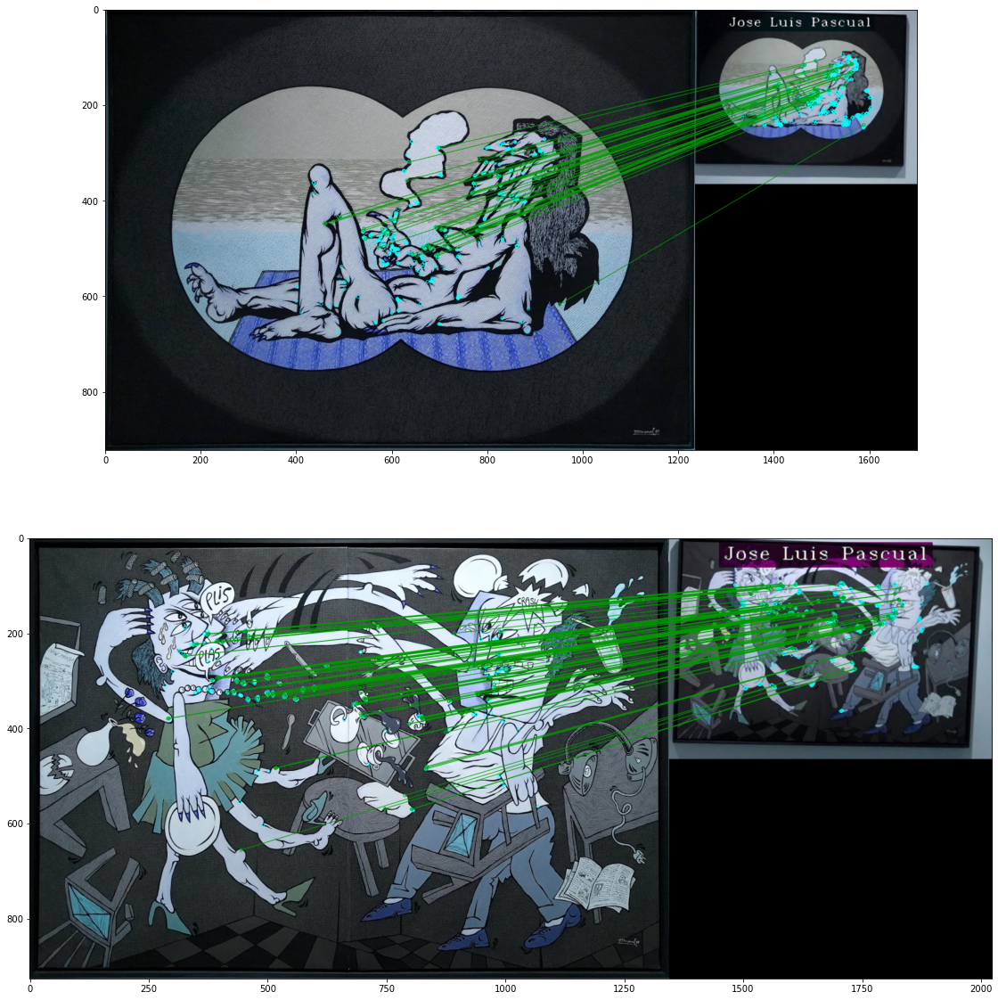

In [68]:
prueba_image_matching(qsd1_w4['00023'], "00199", name2="00034", name3="00252", dist_th = 0.075)

name: 00199, len matches: 162
name: 00034, len matches: 568


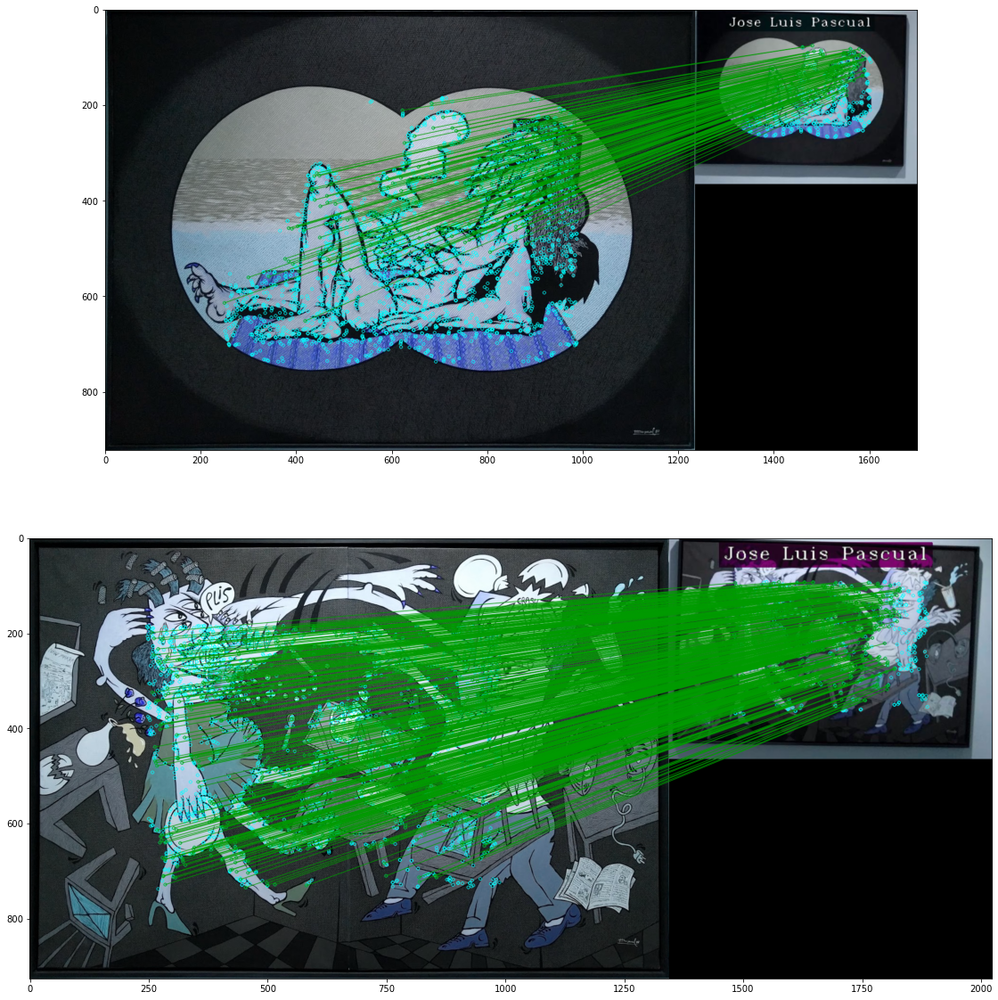

In [69]:
prueba_image_matching(qsd1_w4['00023'], "00199", name2="00034", name3="00252", dist_th = 0.075, method = "AKAZE")